In [2]:
import numpy as np
import pygimli as pg
from pygimli.physics import ert
from pygimli.physics.ert.importData import importRes2dInv
import matplotlib.pyplot as plt
import pygimli.meshtools as mt
from pygimli.frameworks import PriorModelling, JointModelling
from scipy.interpolate import interp1d
import pandas as pd
import pickle
from pygimli.viewer.mpl import draw1DColumn


In [3]:
dir='//smb.isipd.dmawi.de/projects/p_subaqua/Expeditions/2023/NWT2023/analysis_Tuk/Tuk_all_mehriban/'

In [4]:
data = ert.load('//smb.isipd.dmawi.de/projects/sparc/data/Sensors_Mobile/202307_DEPTHAW_InuvikTuk/IRISSyscalProSwitch/res2Dinv/ERT_data_western_amphibious_DAT_raw.txt')

In [5]:
data_topo = ert.load('//smb.isipd.dmawi.de/projects/sparc/data/Sensors_Mobile/202307_DEPTHAW_InuvikTuk/IRISSyscalProSwitch/res2Dinv/ERT_data_western_amphibious_DAT_no_std_filter_with_err.dat')

04/11/25 - 17:26:26 - pyGIMLi - INFO - could not read unified data format for ERT ... try res2dinv


(<Axes: >, <matplotlib.colorbar.Colorbar at 0x24771a09550>)

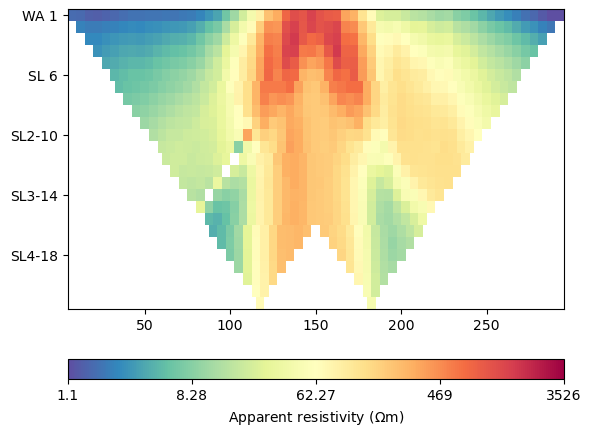

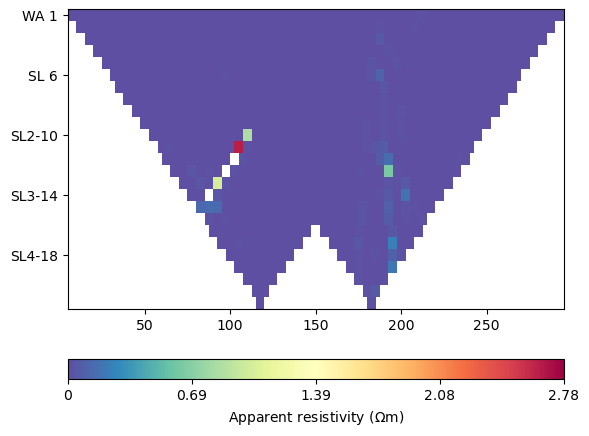

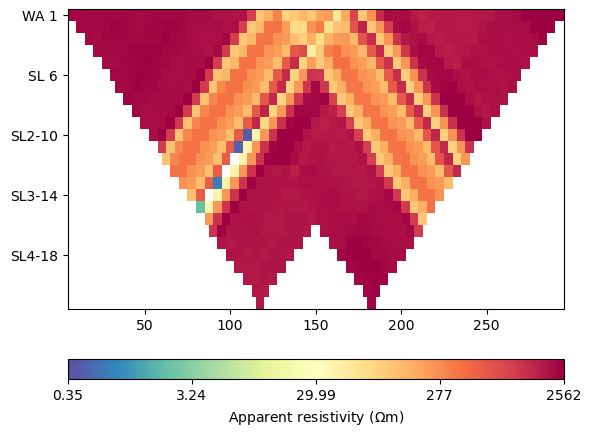

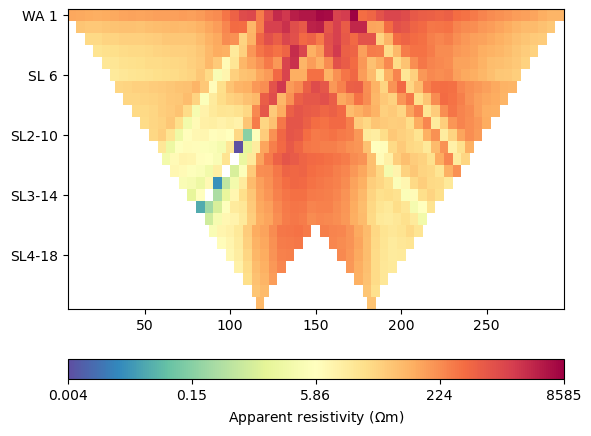

In [5]:
ert.show(data)
ert.show(data, data['err'])
ert.show(data, data['i'])
ert.show(data, data['u'])

(<Axes: >, <matplotlib.colorbar.Colorbar at 0x231ff3519d0>)

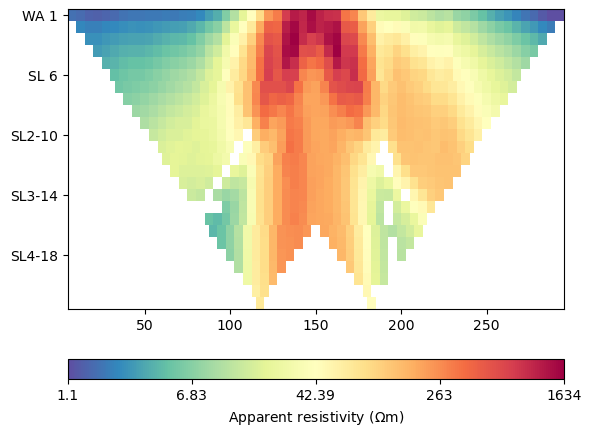

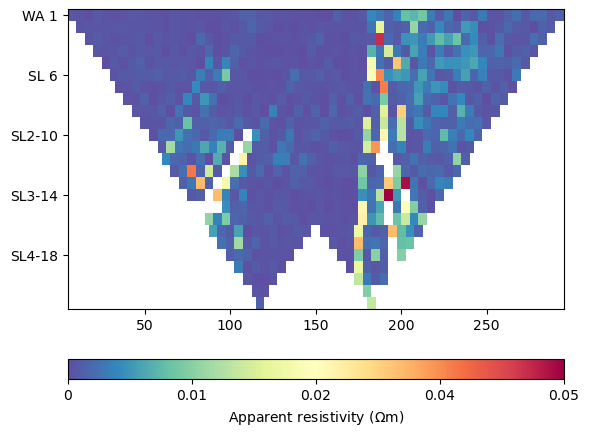

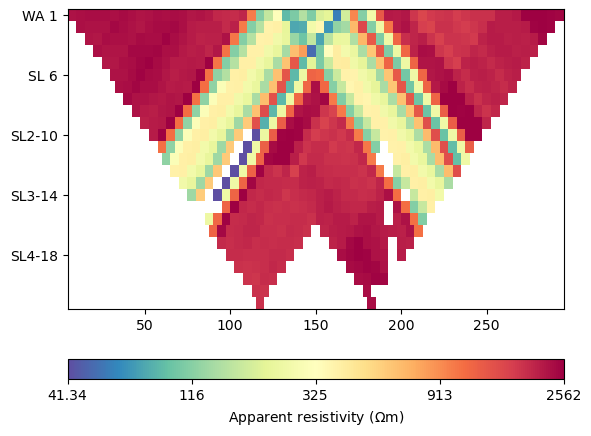

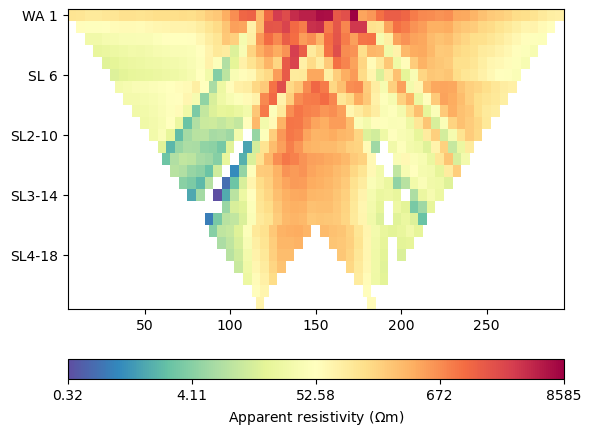

In [6]:
data.remove(data['err']>=0.05)
data.remove(data['i'] < 1)
data.remove(data['rhoa'] <= 0)
ert.show(data)
ert.show(data, data['err'])
ert.show(data, data['i'])
ert.show(data, data['u'])

In [7]:
data['err'] = data['err'] + ert.estimateError(data, relativeError=0.05, absoluteUError=5e-4)
#ert.show(data, data['err'])

In [8]:
data['k'] = ert.createGeometricFactors(data)
data.setSensorPositions(pg.meshtools.interpolateAlongCurve(data_topo.additionalPoints(), pg.x(data_topo)))
data['k_topo'] = ert.createGeometricFactors(data, numerical=True)

04/11/25 - 17:26:42 - pyGIMLi - INFO - Cache c:\Users\mealiy001\AppData\Local\anaconda3\envs\pgcore\Lib\site-packages\pygimli\physics\ert\ert.py:createGeometricFactors restored (0.0s x 3): C:\Users\mealiy001\AppData\Roaming\pygimli\Cache\4425853221272723705
04/11/25 - 17:26:42 - pyGIMLi - INFO - Cache c:\Users\mealiy001\AppData\Local\anaconda3\envs\pgcore\Lib\site-packages\pygimli\physics\ert\ert.py:createGeometricFactors restored (18.7s x 3): C:\Users\mealiy001\AppData\Roaming\pygimli\Cache\5897943192928589163


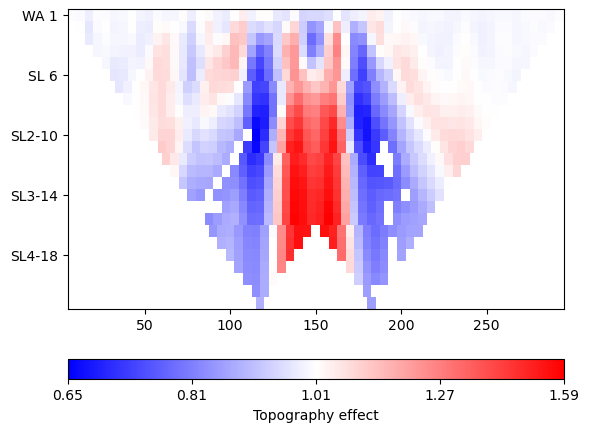

In [187]:
_ = ert.showData(data, vals=data['k_topo']/ data['k'], label='Topography effect',
                 logScale=True, cMap="bwr")

In [9]:
data['rhoa'] = data['r']*data['k_topo']

In [10]:
mgr = ert.ERTManager(data)

In [11]:
np.mean(data['rhoa'])

199.5604508515726

0 -10.000000000000002 -2.59586 0.0
1 -10.000000000000002 -123.26723351596546 0.0
2 304.71601495290366 -123.26723351596546 0.0
3 304.71601495290366 -5.380827534803981 0.0
4 -1188.8640598116147 -2.59586 0.0
5 -1188.8640598116147 -1299.346325792776 0.0
6 1483.5800747645183 -5.380827534803981 0.0
7 1483.5800747645183 -1302.1312933275801 0.0
8 0.0 -2.59586 0.0
9 1.2496859021261466 -2.5678395427025276 0.0
10 3.74905770637844 -2.5117986281075826 0.0
11 4.998743608504586 -2.48377817081011 0.0
12 6.248564641657222 -2.462626971748795 0.0
13 8.748206707962492 -2.420324573626165 0.0
14 9.998027741115127 -2.39917337456485 0.0
15 11.246216441744759 -2.466418321090373 0.0
16 13.742593843004023 -2.6009082141414184 0.0
17 14.990782543633655 -2.6681531606669413 0.0
18 16.240455365698615 -2.6967024029205033 0.0
19 18.739801009828536 -2.753800887427627 0.0
20 19.989473831893495 -2.782350129681189 0.0
21 21.23936230852587 -2.765781667808728 0.0
22 23.739139261790626 -2.7326447440638058 0.0
23 24.9890277384

(-50.0, 381.0)

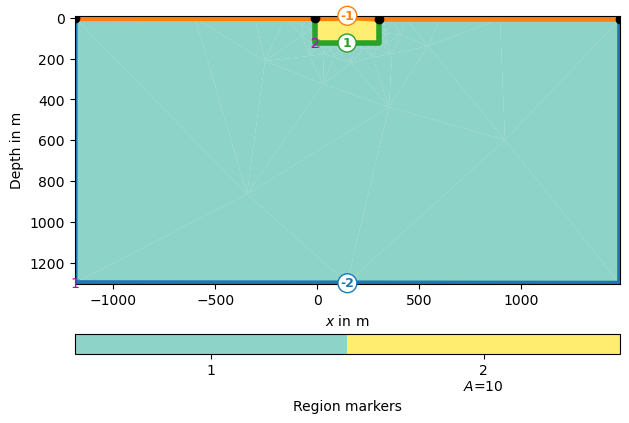

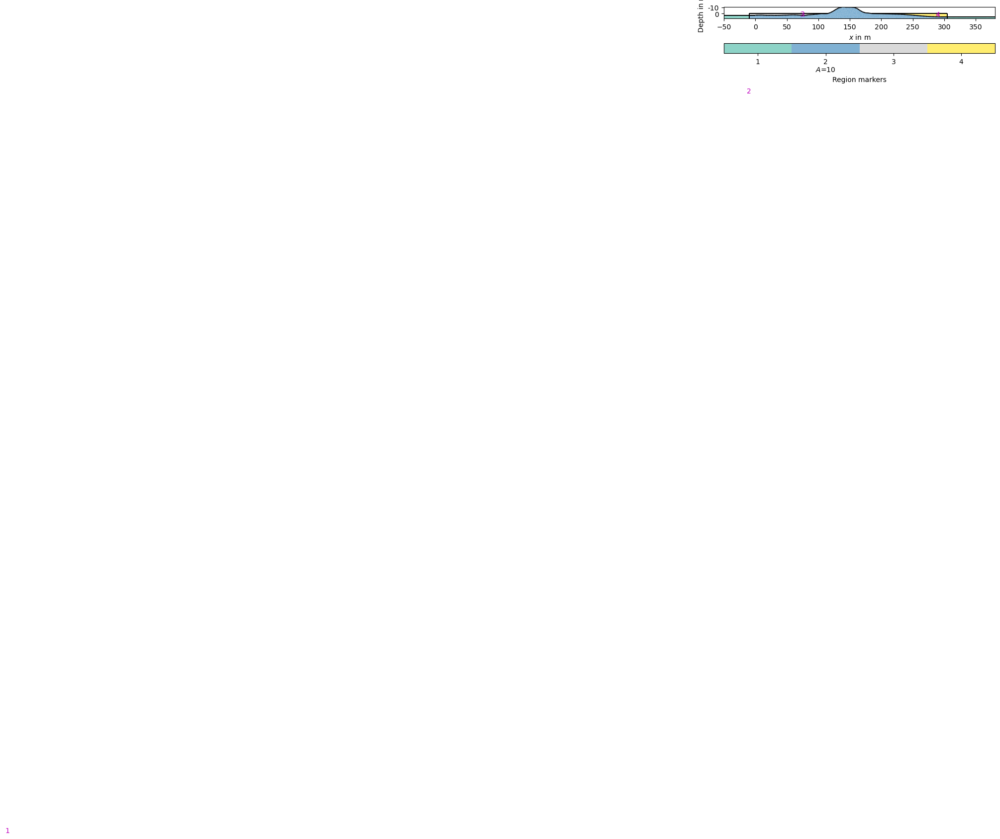

In [12]:
plc = mt.createParaMeshPLC(data,paraDX = 0.25, paraDZ= 0.25, paraMaxCellSize=10)
for i, n in enumerate(plc.nodes()[:]):
    #ax.text(n.x(), n.y(), str(i))
    print(i, n.x(), n.y(), n.z())
for nr, marker in enumerate(plc.regionMarkers()):
    print('Position marker number {}:'.format(nr + 1), marker.x(), marker.y(),
          marker.z())
ax, _ = pg.show(plc, markers=True)

plc.createNode(-10.000000000000002, 0, 0, marker=189)
plc.createNode(115.5, 0, 0, marker=190)
plc.createNode(185, 0, 0, marker=191)
plc.createNode(304.71601495290366, 0, 0, marker=192)

plc.createEdge(plc.node(189), plc.node(190), marker=-1)
plc.createEdge(plc.node(189), plc.node(0), marker=-1)
plc.createEdge(plc.node(191), plc.node(192), marker=-1)
plc.createEdge(plc.node(192), plc.node(3), marker=-1)

plc.addRegionMarker([75, -1], marker=3)  
plc.addRegionMarker([290, -1.5], marker=4)  

ax, _ = pg.show(plc, showMesh=True)
ax.set_ylim(-8)
ax.set_xlim(-50,381)

(-130.0, 381.0)

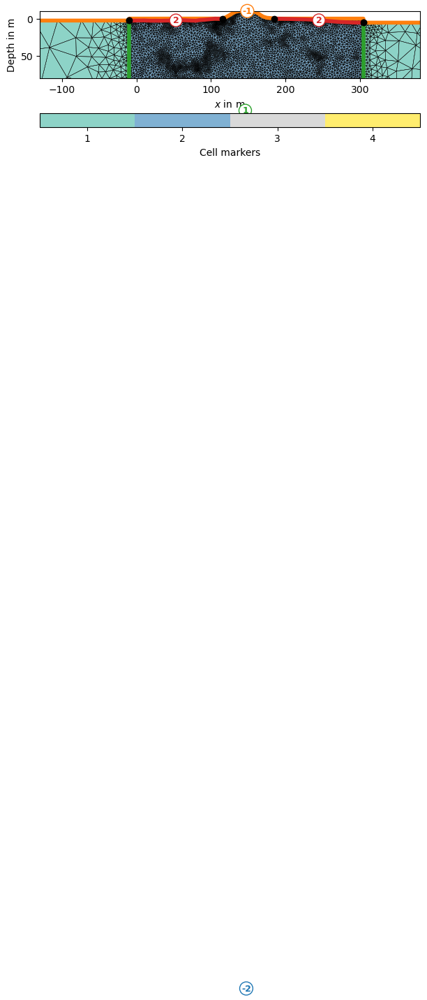

In [13]:
mesh = mt.createMesh(plc, quality=34.5)
for b in mesh.boundaries():
    if b.marker() == -1 and not b.outside():
        b.setMarker(2)

#print(mesh)
ax, _ = pg.show(mesh, markers=True, showMesh=True)
ax.set_ylim(-80)
ax.set_xlim(-130,381)

In [14]:
data
data['k_new'] = ert.createGeometricFactors(data, mesh=mesh, numerical=True)
data['rhoa'] = (data['r'])*data['k_new']

04/11/25 - 17:31:40 - pyGIMLi - INFO - Save RVector binary
04/11/25 - 17:31:40 - pyGIMLi - INFO - Cache stored: C:\Users\mealiy001\AppData\Roaming\pygimli\Cache\4747428718899502796


In [205]:

print(pg.getConfig('tempDir'))


AttributeError: module 'pygimli' has no attribute 'getConfig'

29/10/25 - 16:09:05 - pyGIMLi - INFO - Found 4 regions.
29/10/25 - 16:09:05 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
29/10/25 - 16:09:07 - pyGIMLi - INFO - Creating forward mesh from region infos.
29/10/25 - 16:09:09 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
29/10/25 - 16:09:12 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 26348 Cells: 51652 Boundaries: 39260
29/10/25 - 16:09:15 - pyGIMLi - INFO - Use median(data values)=77.18889136399005
29/10/25 - 16:09:15 - pyGIMLi - INFO - Created startmodel from forward operator:10317, min/max=77.188891/77.188891
29/10/25 - 16:09:15 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000028C8F0B8590>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.85/2066
min/max (error): 5%/9.97%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1090.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  300.81 (dPhi = 72.26%) lam: 10.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   83.75 (dPhi = 72.02%) lam: 10.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   22.93 (dPhi = 71.73%) lam: 10.0
-----

29/10/25 - 17:04:49 - pyGIMLi - INFO - Use median(data values)=77.18889136399005
29/10/25 - 17:04:49 - pyGIMLi - INFO - Created startmodel from forward operator:10317, min/max=77.188891/77.188891
29/10/25 - 17:04:49 - pyGIMLi - INFO - Starting inversion.


chi² =    3.39 (dPhi = 1.01%) lam: 10.0
################################################################################
#                Abort criterion reached: dPhi = 1.01 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000028C8F0B8590>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.85/2066
min/max (error): 5%/9.97%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1090.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  303.56 (dPhi = 71.99%) lam: 1

29/10/25 - 18:20:46 - pyGIMLi - INFO - Use median(data values)=77.18889136399005
29/10/25 - 18:20:46 - pyGIMLi - INFO - Created startmodel from forward operator:10317, min/max=77.188891/77.188891
29/10/25 - 18:20:46 - pyGIMLi - INFO - Starting inversion.


chi² =    3.28 (dPhi = 1.28%) lam: 12.7
################################################################################
#                Abort criterion reached: dPhi = 1.28 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000028C8F0B8590>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.85/2066
min/max (error): 5%/9.97%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1090.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  291.62 (dPhi = 73.05%) lam: 1

29/10/25 - 19:10:02 - pyGIMLi - INFO - Use median(data values)=77.18889136399005
29/10/25 - 19:10:02 - pyGIMLi - INFO - Created startmodel from forward operator:10317, min/max=77.188891/77.188891
29/10/25 - 19:10:02 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000028C8F0B8590>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.85/2066
min/max (error): 5%/9.97%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1090.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  287.02 (dPhi = 73.45%) lam: 20.7
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  130.53 (dPhi = 54.44%) lam: 20.7
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   30.35 (dPhi = 75.75%) lam: 20.7
-----

29/10/25 - 20:15:03 - pyGIMLi - INFO - Use median(data values)=77.18889136399005
29/10/25 - 20:15:03 - pyGIMLi - INFO - Created startmodel from forward operator:10317, min/max=77.188891/77.188891
29/10/25 - 20:15:03 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000028C8F0B8590>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.85/2066
min/max (error): 5%/9.97%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1090.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  281.62 (dPhi = 73.91%) lam: 26.4
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  145.92 (dPhi = 48.18%) lam: 26.4
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   30.89 (dPhi = 77.77%) lam: 26.4
-----

29/10/25 - 21:23:03 - pyGIMLi - INFO - Use median(data values)=77.18889136399005
29/10/25 - 21:23:03 - pyGIMLi - INFO - Created startmodel from forward operator:10317, min/max=77.188891/77.188891
29/10/25 - 21:23:03 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000028C8F0B8590>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.85/2066
min/max (error): 5%/9.97%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1090.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  274.05 (dPhi = 74.57%) lam: 33.6
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  159.02 (dPhi = 42.05%) lam: 33.6
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   31.55 (dPhi = 79.03%) lam: 33.6
-----

29/10/25 - 22:19:29 - pyGIMLi - INFO - Use median(data values)=77.18889136399005
29/10/25 - 22:19:29 - pyGIMLi - INFO - Created startmodel from forward operator:10317, min/max=77.188891/77.188891
29/10/25 - 22:19:29 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000028C8F0B8590>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.85/2066
min/max (error): 5%/9.97%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1090.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  264.55 (dPhi = 75.40%) lam: 42.8
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  148.88 (dPhi = 43.76%) lam: 42.8
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   29.02 (dPhi = 79.10%) lam: 42.8
-----

29/10/25 - 23:18:24 - pyGIMLi - INFO - Use median(data values)=77.18889136399005
29/10/25 - 23:18:24 - pyGIMLi - INFO - Created startmodel from forward operator:10317, min/max=77.188891/77.188891
29/10/25 - 23:18:24 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000028C8F0B8590>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.85/2066
min/max (error): 5%/9.97%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1090.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  256.35 (dPhi = 76.14%) lam: 54.6
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   86.32 (dPhi = 65.92%) lam: 54.6
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   17.58 (dPhi = 76.86%) lam: 54.6
-----

30/10/25 - 00:01:19 - pyGIMLi - INFO - Use median(data values)=77.18889136399005
30/10/25 - 00:01:19 - pyGIMLi - INFO - Created startmodel from forward operator:10317, min/max=77.188891/77.188891
30/10/25 - 00:01:19 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000028C8F0B8590>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.85/2066
min/max (error): 5%/9.97%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1090.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  247.49 (dPhi = 76.92%) lam: 69.5
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   91.59 (dPhi = 62.53%) lam: 69.5
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   17.90 (dPhi = 77.41%) lam: 69.5
-----

30/10/25 - 00:58:14 - pyGIMLi - INFO - Use median(data values)=77.18889136399005
30/10/25 - 00:58:14 - pyGIMLi - INFO - Created startmodel from forward operator:10317, min/max=77.188891/77.188891
30/10/25 - 00:58:14 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000028C8F0B8590>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.85/2066
min/max (error): 5%/9.97%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1090.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  238.69 (dPhi = 77.70%) lam: 88.6
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   85.74 (dPhi = 63.37%) lam: 88.6
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   16.64 (dPhi = 76.73%) lam: 88.6
-----

30/10/25 - 01:48:43 - pyGIMLi - INFO - Use median(data values)=77.18889136399005
30/10/25 - 01:48:43 - pyGIMLi - INFO - Created startmodel from forward operator:10317, min/max=77.188891/77.188891
30/10/25 - 01:48:43 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000028C8F0B8590>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.85/2066
min/max (error): 5%/9.97%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1090.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  231.43 (dPhi = 78.34%) lam: 112.9
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   77.93 (dPhi = 65.30%) lam: 112.9
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   15.06 (dPhi = 75.61%) lam: 112.9
--

30/10/25 - 02:52:40 - pyGIMLi - INFO - Use median(data values)=77.18889136399005
30/10/25 - 02:52:41 - pyGIMLi - INFO - Created startmodel from forward operator:10317, min/max=77.188891/77.188891
30/10/25 - 02:52:41 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000028C8F0B8590>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.85/2066
min/max (error): 5%/9.97%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1090.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  224.03 (dPhi = 79.01%) lam: 143.8
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   70.40 (dPhi = 67.07%) lam: 143.8
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   13.61 (dPhi = 73.94%) lam: 143.8
--

30/10/25 - 03:53:38 - pyGIMLi - INFO - Use median(data values)=77.18889136399005
30/10/25 - 03:53:38 - pyGIMLi - INFO - Created startmodel from forward operator:10317, min/max=77.188891/77.188891
30/10/25 - 03:53:38 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000028C8F0B8590>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.85/2066
min/max (error): 5%/9.97%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1090.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  223.96 (dPhi = 79.02%) lam: 183.3
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   59.87 (dPhi = 71.18%) lam: 183.3
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   12.20 (dPhi = 70.53%) lam: 183.3
--

30/10/25 - 04:37:13 - pyGIMLi - INFO - Use median(data values)=77.18889136399005
30/10/25 - 04:37:13 - pyGIMLi - INFO - Created startmodel from forward operator:10317, min/max=77.188891/77.188891
30/10/25 - 04:37:13 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000028C8F0B8590>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.85/2066
min/max (error): 5%/9.97%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1090.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  226.07 (dPhi = 78.86%) lam: 233.6
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   50.78 (dPhi = 74.64%) lam: 233.6
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   11.49 (dPhi = 65.53%) lam: 233.6
--

30/10/25 - 05:34:41 - pyGIMLi - INFO - Use median(data values)=77.18889136399005
30/10/25 - 05:34:41 - pyGIMLi - INFO - Created startmodel from forward operator:10317, min/max=77.188891/77.188891
30/10/25 - 05:34:41 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000028C8F0B8590>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.85/2066
min/max (error): 5%/9.97%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1090.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  223.34 (dPhi = 79.10%) lam: 297.6
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   45.03 (dPhi = 76.10%) lam: 297.6
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   11.53 (dPhi = 60.28%) lam: 297.6
--

30/10/25 - 06:14:30 - pyGIMLi - INFO - Use median(data values)=77.18889136399005
30/10/25 - 06:14:30 - pyGIMLi - INFO - Created startmodel from forward operator:10317, min/max=77.188891/77.188891
30/10/25 - 06:14:30 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000028C8F0B8590>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.85/2066
min/max (error): 5%/9.97%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1090.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  220.06 (dPhi = 79.40%) lam: 379.3
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   43.11 (dPhi = 75.71%) lam: 379.3
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   12.03 (dPhi = 56.54%) lam: 379.3
--

30/10/25 - 06:56:49 - pyGIMLi - INFO - Use median(data values)=77.18889136399005
30/10/25 - 06:56:49 - pyGIMLi - INFO - Created startmodel from forward operator:10317, min/max=77.188891/77.188891
30/10/25 - 06:56:49 - pyGIMLi - INFO - Starting inversion.


chi² =   10.05 (dPhi = 1.00%) lam: 379.3
################################################################################
#                 Abort criterion reached: dPhi = 1.0 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000028C8F0B8590>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.85/2066
min/max (error): 5%/9.97%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1090.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  216.18 (dPhi = 79.72%) lam: 

30/10/25 - 07:39:56 - pyGIMLi - INFO - Use median(data values)=77.18889136399005
30/10/25 - 07:39:56 - pyGIMLi - INFO - Created startmodel from forward operator:10317, min/max=77.188891/77.188891
30/10/25 - 07:39:56 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000028C8F0B8590>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.85/2066
min/max (error): 5%/9.97%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1090.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  212.27 (dPhi = 80.07%) lam: 615.8
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   37.11 (dPhi = 75.38%) lam: 615.8
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   13.85 (dPhi = 45.54%) lam: 615.8
--

30/10/25 - 08:21:49 - pyGIMLi - INFO - Use median(data values)=77.18889136399005
30/10/25 - 08:21:49 - pyGIMLi - INFO - Created startmodel from forward operator:10317, min/max=77.188891/77.188891
30/10/25 - 08:21:49 - pyGIMLi - INFO - Starting inversion.


chi² =   12.59 (dPhi = 0.77%) lam: 615.8
################################################################################
#                Abort criterion reached: dPhi = 0.77 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000028C8F0B8590>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.85/2066
min/max (error): 5%/9.97%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1090.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  208.47 (dPhi = 80.38%) lam: 

30/10/25 - 09:09:34 - pyGIMLi - INFO - Use median(data values)=77.18889136399005
30/10/25 - 09:09:34 - pyGIMLi - INFO - Created startmodel from forward operator:10317, min/max=77.188891/77.188891
30/10/25 - 09:09:34 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000028C8F0B8590>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.85/2066
min/max (error): 5%/9.97%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1090.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  205.04 (dPhi = 80.64%) lam: 1000.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   34.24 (dPhi = 73.21%) lam: 1000.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   17.12 (dPhi = 35.03%) lam: 1000.0

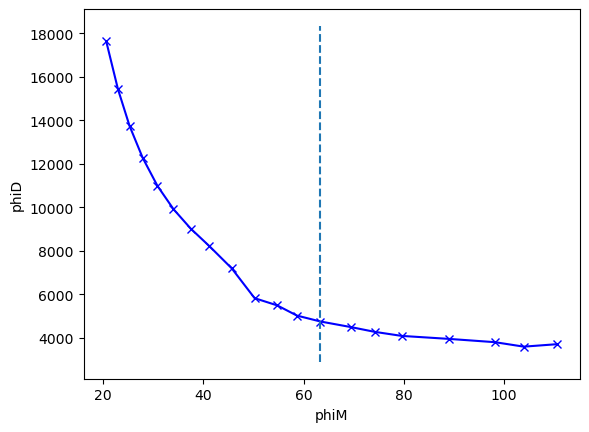

In [134]:
mgr.setMesh(mesh)


mgr.inv.setRegularization(3, single=True)
mgr.inv.setRegularization(4, single=True)


lambdas = np.logspace(1, 3, 20)
phiD = []
phiM = []
for lam in lambdas:
    mgr.invert(data, lam=lam, verbose=True, blockyModel=True, zWeight=0.5)
    phiD.append(mgr.inv.phiData())
    phiM.append(mgr.inv.phiModel())

phiD = np.array(phiD)
phiM = np.array(phiM)

from kneed import DataGenerator, KneeLocator
kneedle = KneeLocator(phiM, phiD, online=True, curve="convex", direction="decreasing",interp_method='polynomial', polynomial_degree=2)

print(round(kneedle.elbow, 3))
print(round(kneedle.elbow_y, 3))
print(lambdas[np.where(phiM==kneedle.elbow)[0]])

plt.xlabel('phiM')
plt.ylabel('phiD')
plt.plot(phiM, phiD, 'bx-')
plt.vlines(kneedle.elbow, plt.ylim()[0], plt.ylim()[1], linestyles='dashed')

In [139]:
# Create a DataFrame
df = pd.DataFrame({
    'lambda': lambdas,
    'phiD': phiD,
    'phiM': phiM
})

# Save to CSV
df.to_csv(dir + 'pygimli/lcurve_results_western_amphibious_err5perc50mv_zWeight5_blocky_singlereg_25cellsize_345quality.csv', index=False)

print(df.head())

      lambda         phiD        phiM
0  10.000000  3697.024002  110.611398
1  12.742750  3583.475120  103.962843
2  16.237767  3789.482270   98.183597
3  20.691381  3941.148128   88.985295
4  26.366509  4077.918878   79.595451


Elbow (x): 54.731
Elbow (y): 5483.786
[88.58667904]


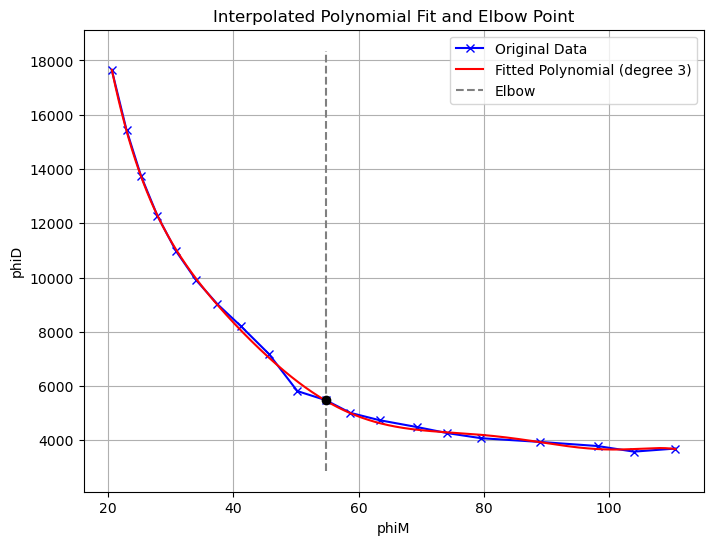

In [173]:
import numpy as np
import matplotlib.pyplot as plt
from kneed import KneeLocator

kneedle = KneeLocator(
    phiM, phiD,
    online=True,
    curve="convex",
    direction="decreasing",
    interp_method='polynomial',
    polynomial_degree=7
)

# --- Print knee location ---
print("Elbow (x):", round(kneedle.elbow, 3))
print("Elbow (y):", round(kneedle.elbow_y, 3))
print(lambdas[np.where(phiM==kneedle.elbow)[0]])
# --- Recreate the interpolated polynomial fit manually ---
degree = 7  # same as polynomial_degree
coeffs = np.polyfit(phiM, phiD, degree)
poly = np.poly1d(coeffs)

# Generate smooth fitted curve
phiM_fit = np.linspace(min(phiM), max(phiM), 1000)
phiD_fit = poly(phiM_fit)

# --- Plot ---
plt.figure(figsize=(8,6))
plt.plot(phiM, phiD, 'bx-', label='Original Data')
plt.plot(phiM_fit, phiD_fit, 'r-', label='Fitted Polynomial (degree 3)')
plt.vlines(kneedle.elbow, plt.ylim()[0], plt.ylim()[1], linestyles='dashed', color='gray', label='Elbow')
plt.scatter(kneedle.elbow, kneedle.elbow_y, color='black', zorder=5)

plt.xlabel('phiM')
plt.ylabel('phiD')
plt.legend()
plt.title('Interpolated Polynomial Fit and Elbow Point')
plt.grid(True)
plt.show()

31/10/25 - 08:41:35 - pyGIMLi - INFO - Found 4 regions.
31/10/25 - 08:41:35 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
31/10/25 - 08:41:39 - pyGIMLi - INFO - Creating forward mesh from region infos.
31/10/25 - 08:41:41 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
31/10/25 - 08:41:46 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 26348 Cells: 51652 Boundaries: 39260
31/10/25 - 08:41:50 - pyGIMLi - INFO - Use median(data values)=77.18889136399005
31/10/25 - 08:41:50 - pyGIMLi - INFO - Created startmodel from forward operator:10317, min/max=77.188891/77.188891
31/10/25 - 08:41:50 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000028C8F0B8590>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.85/2066
min/max (error): 5%/9.97%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1090.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  243.96 (dPhi = 77.30%) lam: 88.5
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   69.72 (dPhi = 70.53%) lam: 88.5
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   14.10 (dPhi = 75.12%) lam: 88.5
-----

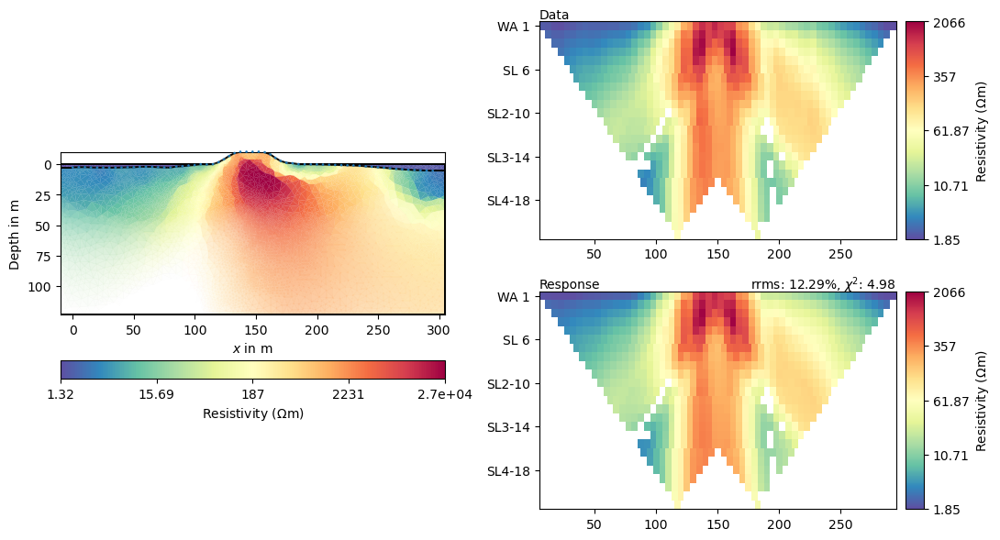

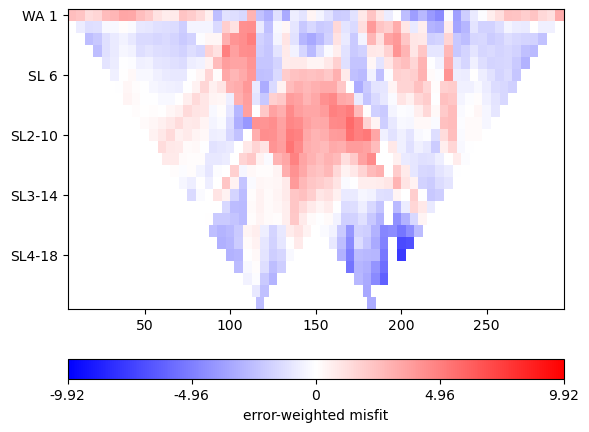

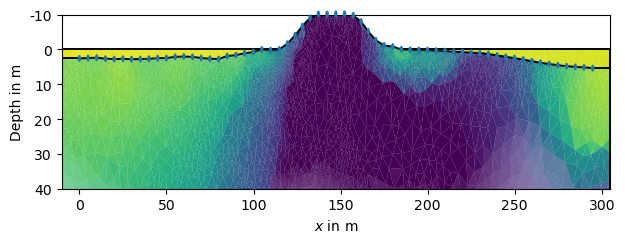

In [167]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, single=True)
mgr.inv.setRegularization(4, single=True)

inv = mgr.invert(lam=88.5, verbose=True, blockyModel=True, zWeight=0.5)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

ax, cb = mgr.showResult(cMin=1, cMax=1000, cMap='viridis_r', colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

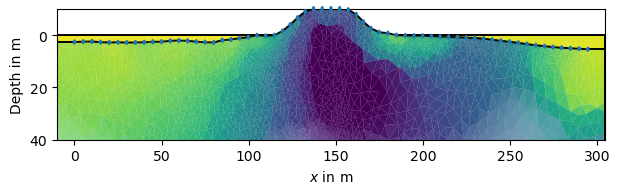

In [175]:
ax, cb = mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r', colorBar=False, showMesh=False)
ax.set_ylim(-40, 10)
ax.set_aspect(1.5)

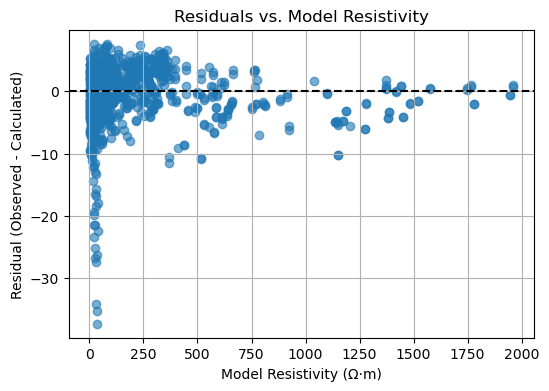

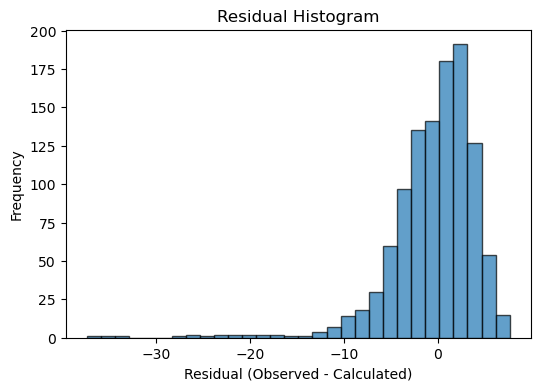

In [138]:
d_calc = mgr.inv.response.array()  # calculated apparent resistivity
d_obs = mgr.data['rhoa']
residuals = (d_obs - d_calc)/(mgr.data['err']*d_obs)


plt.figure(figsize=(6,4))
plt.scatter(d_calc, residuals, alpha=0.6)
plt.axhline(0, color='k', linestyle='--')
plt.xlabel('Model Resistivity (Ω·m)')
plt.ylabel('Residual (Observed - Calculated)')
plt.title('Residuals vs. Model Resistivity')
plt.grid(True)
plt.show()

plt.figure(figsize=(6,4))
plt.hist(residuals, bins=30, edgecolor='k', alpha=0.7)
plt.xlabel('Residual (Observed - Calculated)')
plt.ylabel('Frequency')
plt.title('Residual Histogram')
plt.show()

29/10/25 - 15:38:03 - pyGIMLi - INFO - Found 4 regions.
29/10/25 - 15:38:03 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
29/10/25 - 15:38:05 - pyGIMLi - INFO - Creating forward mesh from region infos.
29/10/25 - 15:38:07 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
29/10/25 - 15:38:10 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 26348 Cells: 51652 Boundaries: 39260
29/10/25 - 15:38:13 - pyGIMLi - INFO - Use median(data values)=77.18889136399005
29/10/25 - 15:38:13 - pyGIMLi - INFO - Created startmodel from forward operator:10317, min/max=77.188891/77.188891
29/10/25 - 15:38:13 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000028C8F0B8590>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 10000.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.85/2066
min/max (error): 5%/9.97%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1090.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  295.53 (dPhi = 72.67%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  131.11 (dPhi = 55.57%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   29.98 (dPhi = 75.98%) lam: 20.0
-

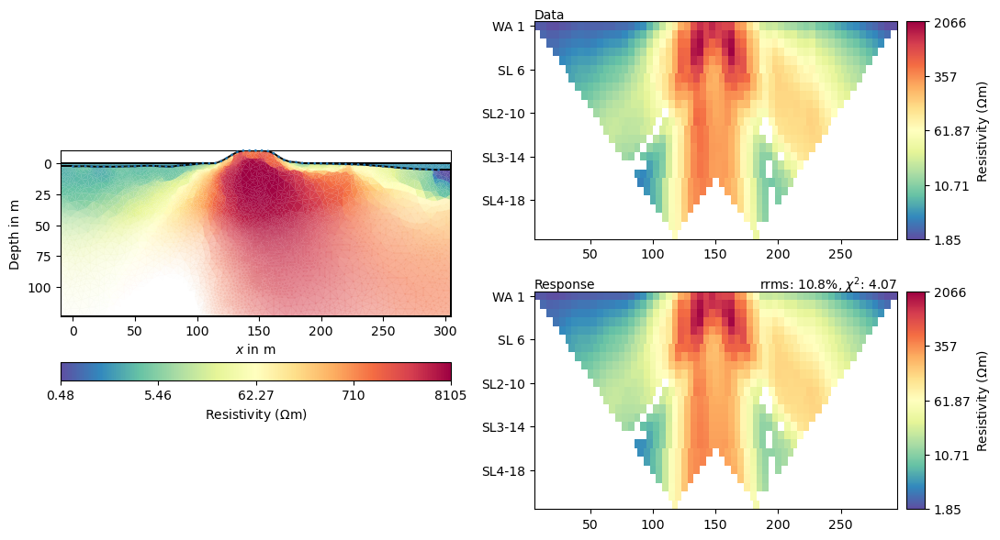

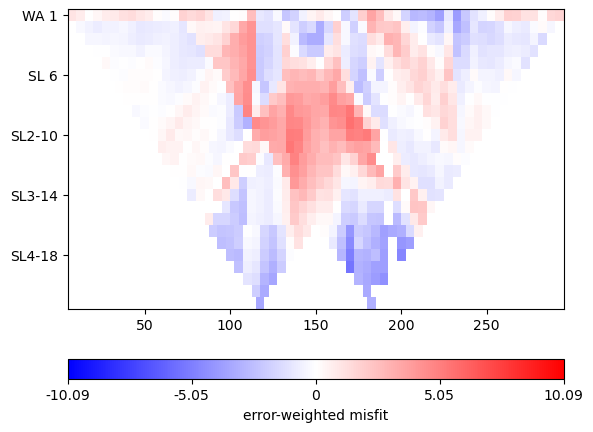

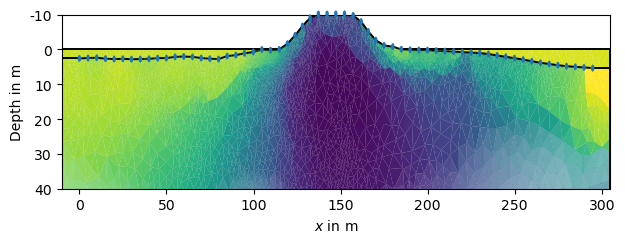

In [132]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, single=True)
mgr.inv.setRegularization(4, single=True)
mgr.inv.setRegularization(2, limits=[0, 10000])

inv = mgr.invert(lam=20, verbose=True, blockyModel=True, zWeight=0.5)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

ax, cb = mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r', colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

29/10/25 - 14:49:51 - pyGIMLi - INFO - Found 4 regions.
29/10/25 - 14:49:51 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
29/10/25 - 14:49:52 - pyGIMLi - INFO - Creating forward mesh from region infos.
29/10/25 - 14:49:53 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
29/10/25 - 14:49:55 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 26348 Cells: 51652 Boundaries: 39260
29/10/25 - 14:49:56 - pyGIMLi - INFO - Use median(data values)=77.18889136399005
29/10/25 - 14:49:56 - pyGIMLi - INFO - Created startmodel from forward operator:10317, min/max=77.188891/77.188891
29/10/25 - 14:49:56 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000028C8F0B8590>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.85/2066
min/max (error): 5%/9.97%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1090.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  280.21 (dPhi = 74.12%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  116.37 (dPhi = 58.39%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   25.49 (dPhi = 77.06%) lam: 20.0
-----

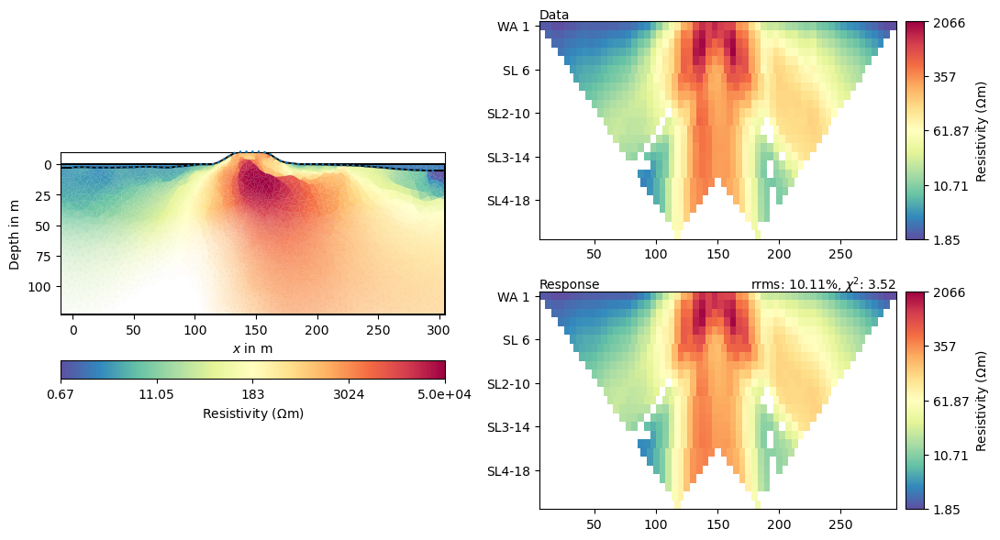

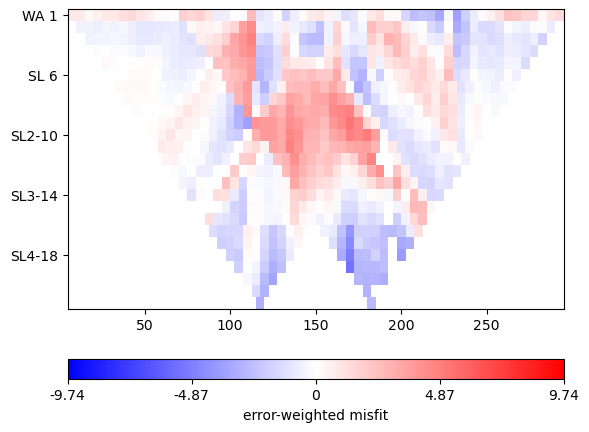

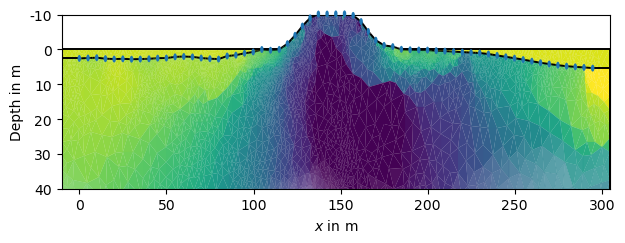

In [125]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, single=True)
mgr.inv.setRegularization(4, single=True)

inv = mgr.invert(lam=20, verbose=True, blockyModel=True, zWeight=0.5)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

ax, cb = mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r', colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

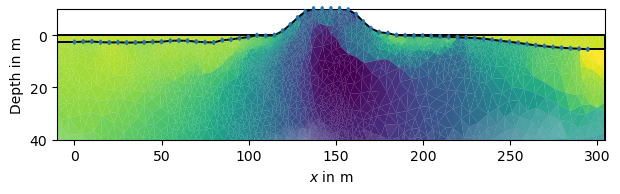

In [130]:
ax, cb = mgr.showResult(cMap='viridis_r', colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(1.5)

29/10/25 - 14:24:53 - pyGIMLi - INFO - Found 4 regions.
29/10/25 - 14:24:53 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
29/10/25 - 14:24:53 - pyGIMLi - INFO - Creating forward mesh from region infos.
29/10/25 - 14:24:54 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
29/10/25 - 14:24:55 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 15729 Cells: 30416 Boundaries: 23332
29/10/25 - 14:24:56 - pyGIMLi - INFO - Use median(data values)=77.18889136399005
29/10/25 - 14:24:56 - pyGIMLi - INFO - Created startmodel from forward operator:5855, min/max=77.188891/77.188891
29/10/25 - 14:24:56 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000028C8F0B8590>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.85/2066
min/max (error): 5%/9.97%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1090.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  272.59 (dPhi = 74.84%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  152.17 (dPhi = 44.12%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   32.86 (dPhi = 77.55%) lam: 20.0
-----

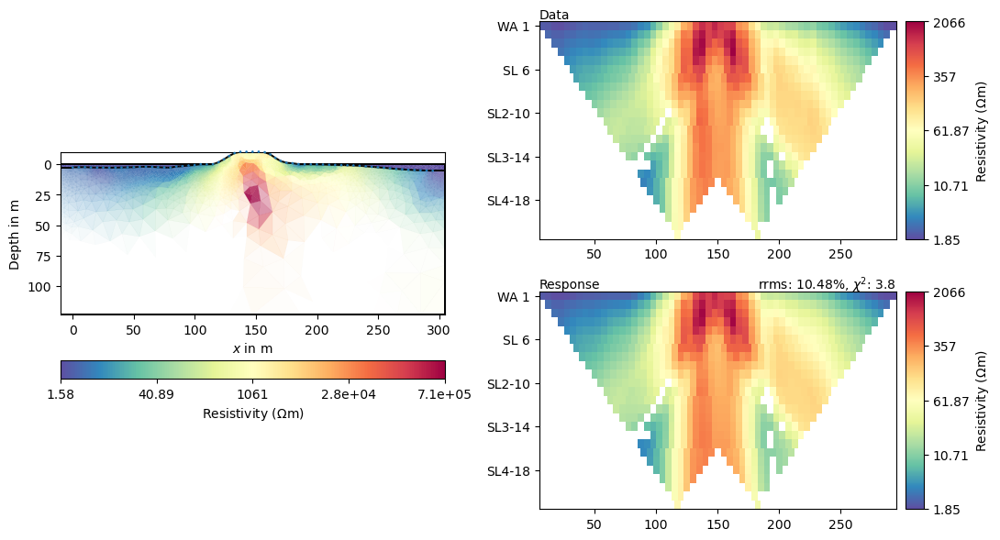

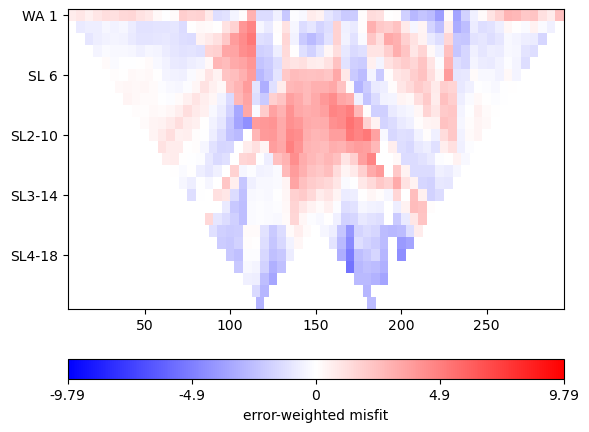

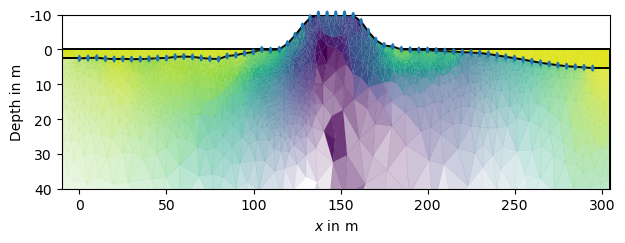

In [121]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, single=True)
mgr.inv.setRegularization(4, single=True)

inv = mgr.invert(lam=20, verbose=True, blockyModel=True, zWeight=0.5)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

ax, cb = mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r', colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

29/10/25 - 14:08:54 - pyGIMLi - INFO - Found 4 regions.
29/10/25 - 14:08:54 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
29/10/25 - 14:08:55 - pyGIMLi - INFO - Creating forward mesh from region infos.
29/10/25 - 14:08:55 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
29/10/25 - 14:08:56 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 8795 Cells: 16688 Boundaries: 12966
29/10/25 - 14:08:57 - pyGIMLi - INFO - Use median(data values)=77.18815899198106
29/10/25 - 14:08:57 - pyGIMLi - INFO - Created startmodel from forward operator:3071, min/max=77.188159/77.188159
29/10/25 - 14:08:57 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000028C8F0B8590>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.85/2066
min/max (error): 5%/9.97%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1090.89
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  270.24 (dPhi = 74.88%) lam: 50.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  111.36 (dPhi = 58.63%) lam: 40.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   19.03 (dPhi = 81.41%) lam: 32.0
-----

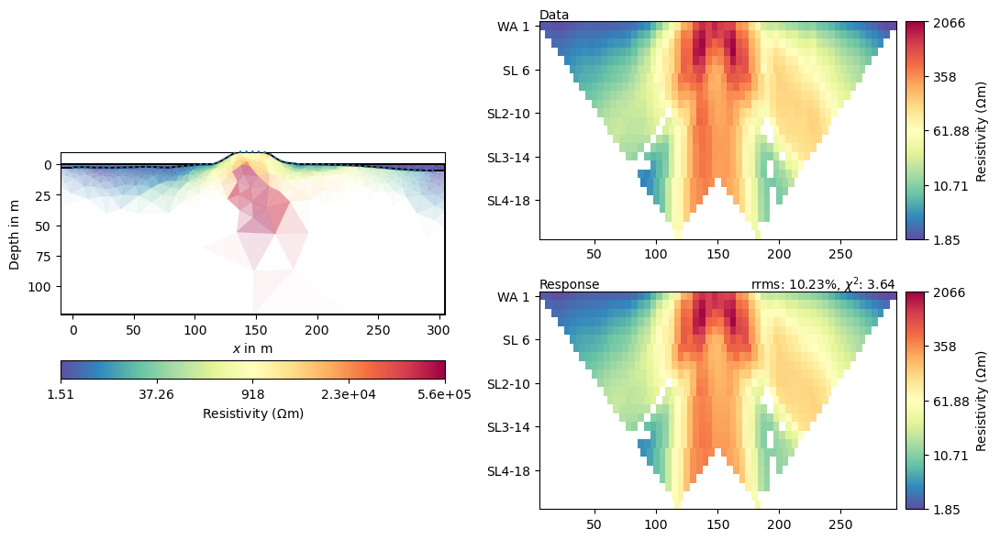

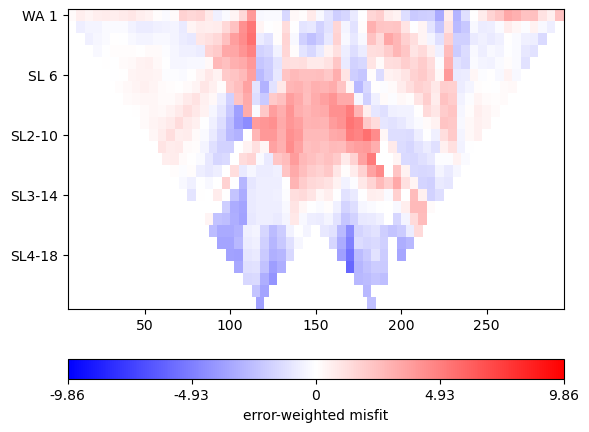

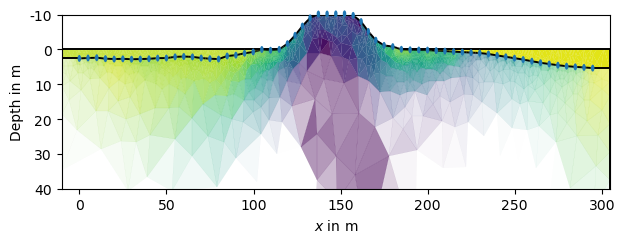

In [117]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, single=True)
mgr.inv.setRegularization(4, single=True)

inv = mgr.invert(lam=50, verbose=True, blockyModel=True, zWeight=0.5, lambdaFactor=0.8)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

ax, cb = mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r', colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

29/10/25 - 14:00:23 - pyGIMLi - INFO - Found 4 regions.
29/10/25 - 14:00:23 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
29/10/25 - 14:00:23 - pyGIMLi - INFO - Creating forward mesh from region infos.
29/10/25 - 14:00:24 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
29/10/25 - 14:00:24 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 8795 Cells: 16688 Boundaries: 12966
29/10/25 - 14:00:25 - pyGIMLi - INFO - Use median(data values)=77.18815899198106
29/10/25 - 14:00:25 - pyGIMLi - INFO - Created startmodel from forward operator:3071, min/max=77.188159/77.188159
29/10/25 - 14:00:25 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000028C8F0B8590>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.85/2066
min/max (error): 5%/9.97%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1090.89
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  294.34 (dPhi = 72.66%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  131.04 (dPhi = 55.56%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   28.27 (dPhi = 77.31%) lam: 20.0
-----

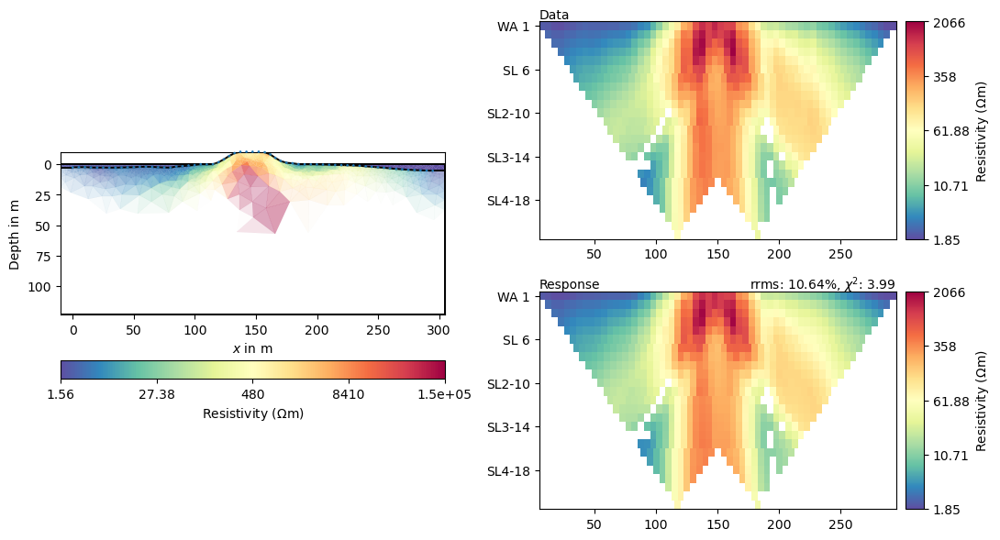

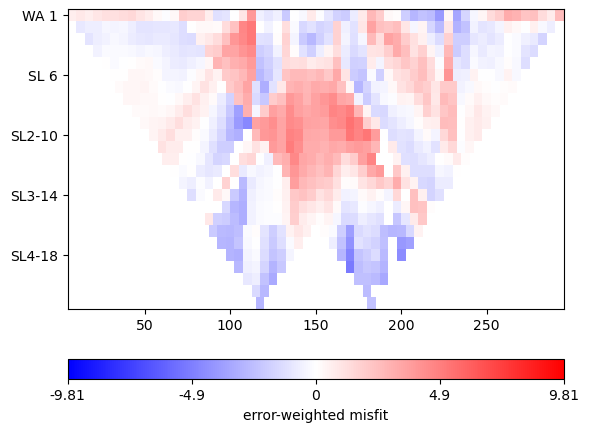

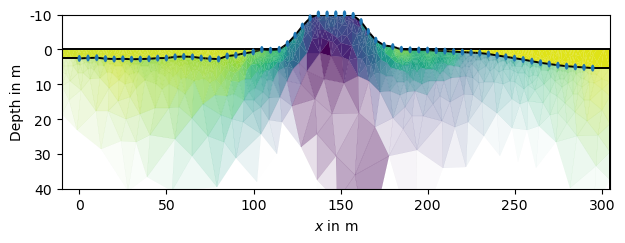

In [115]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, single=True)
mgr.inv.setRegularization(4, single=True)

inv = mgr.invert(lam=20, verbose=True, blockyModel=True, zWeight=0.5)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

ax, cb = mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r', colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

29/10/25 - 13:47:50 - pyGIMLi - INFO - Found 4 regions.
29/10/25 - 13:47:50 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
29/10/25 - 13:47:51 - pyGIMLi - INFO - Creating forward mesh from region infos.
29/10/25 - 13:47:52 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
29/10/25 - 13:47:52 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 8795 Cells: 16688 Boundaries: 12966
29/10/25 - 13:47:53 - pyGIMLi - INFO - Use median(data values)=77.18815899198106
29/10/25 - 13:47:53 - pyGIMLi - INFO - Created startmodel from forward operator:3071, min/max=77.188159/77.188159
29/10/25 - 13:47:53 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000028BE5280590>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.85/2066
min/max (error): 5%/5.16%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1157.34
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  337.07 (dPhi = 70.63%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  110.21 (dPhi = 51.21%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   24.56 (dPhi = 78.70%) lam: 20.0
-----

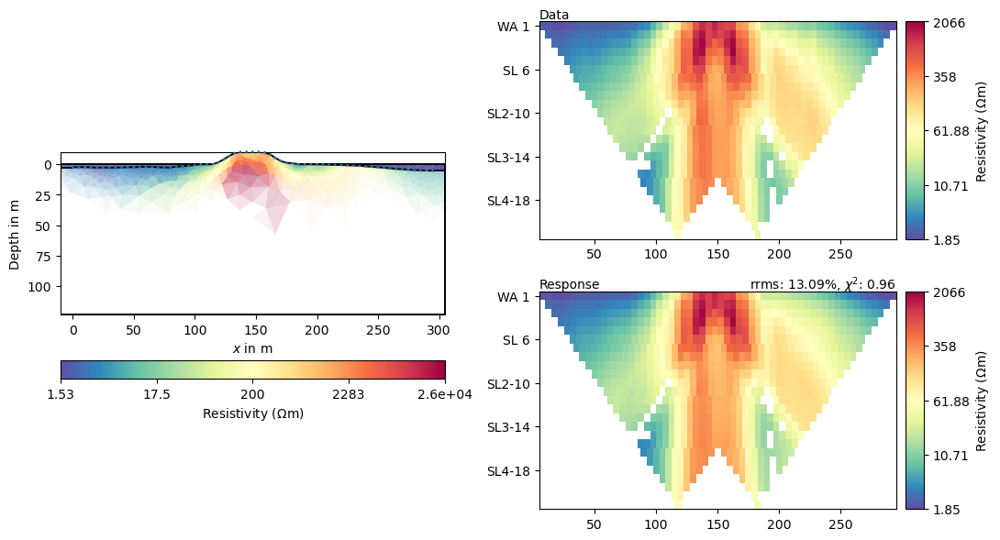

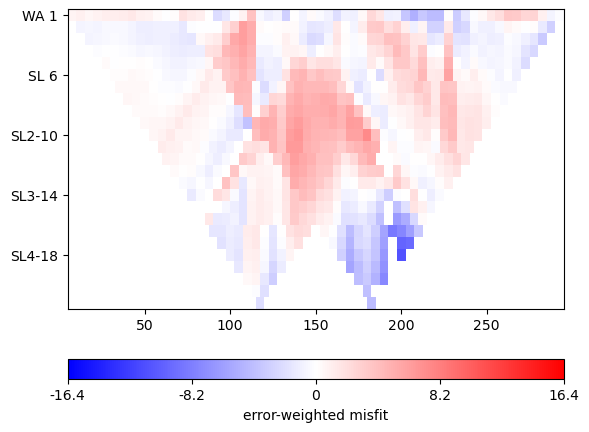

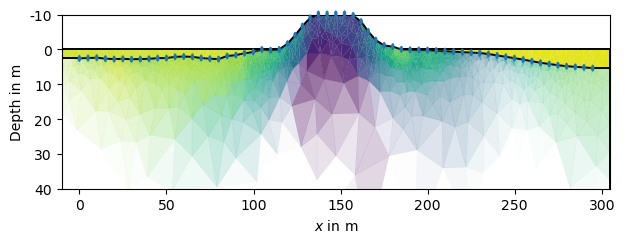

In [100]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, single=True)
mgr.inv.setRegularization(4, single=True)

inv = mgr.invert(lam=20, verbose=True, blockyModel=True, zWeight=0.5, robustData=True)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

ax, cb = mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r', colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

29/10/25 - 13:25:18 - pyGIMLi - INFO - Found 4 regions.
29/10/25 - 13:25:18 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
29/10/25 - 13:25:19 - pyGIMLi - INFO - Creating forward mesh from region infos.
29/10/25 - 13:25:19 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
29/10/25 - 13:25:20 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 8795 Cells: 16688 Boundaries: 12966
29/10/25 - 13:25:21 - pyGIMLi - INFO - Use median(data values)=77.18815899198106
29/10/25 - 13:25:21 - pyGIMLi - INFO - Created startmodel from forward operator:3071, min/max=77.188159/77.188159
29/10/25 - 13:25:21 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000028BE5280590>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.85/2066
min/max (error): 5%/5.16%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1157.34
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  326.76 (dPhi = 71.54%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  138.95 (dPhi = 57.34%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   32.06 (dPhi = 75.91%) lam: 20.0
-----

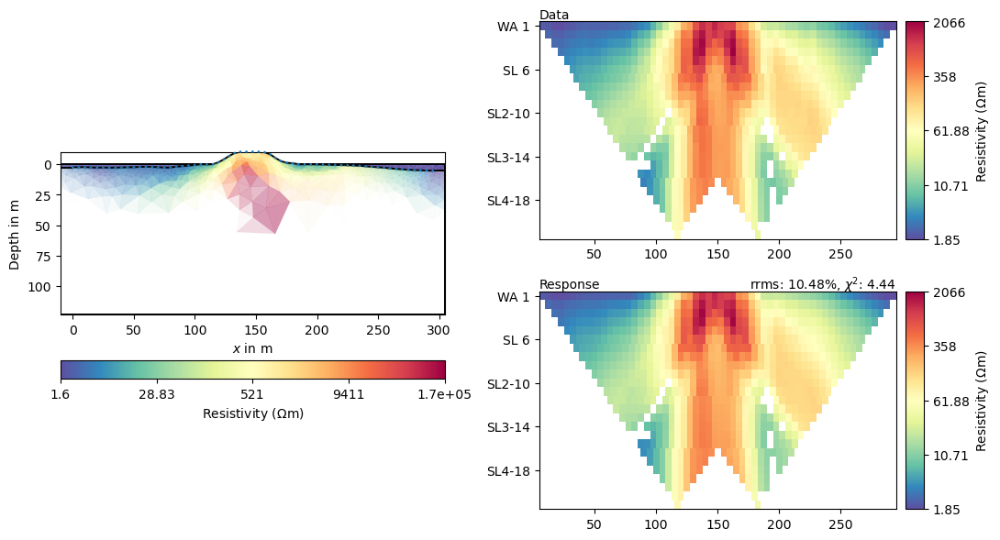

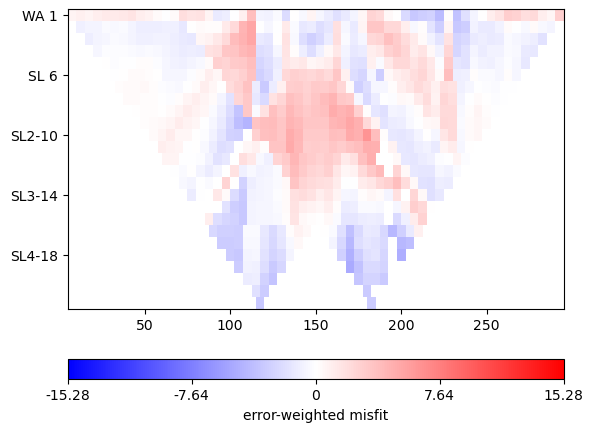

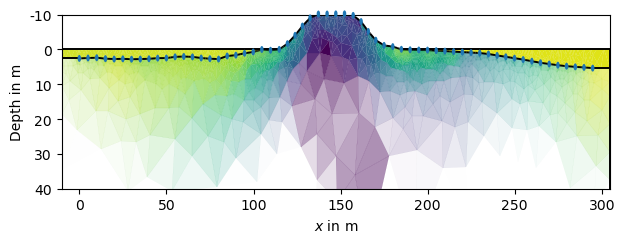

In [95]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, single=True)
mgr.inv.setRegularization(4, single=True)

inv = mgr.invert(lam=20, verbose=True, blockyModel=True, zWeight=0.5)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

ax, cb = mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r', colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

29/10/25 - 13:13:57 - pyGIMLi - INFO - Found 4 regions.
29/10/25 - 13:13:57 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
29/10/25 - 13:13:58 - pyGIMLi - INFO - Creating forward mesh from region infos.
29/10/25 - 13:13:58 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
29/10/25 - 13:13:59 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 8795 Cells: 16688 Boundaries: 12966
29/10/25 - 13:14:00 - pyGIMLi - INFO - Use median(data values)=77.18815899198106
29/10/25 - 13:14:00 - pyGIMLi - INFO - Created startmodel from forward operator:3071, min/max=77.188159/77.188159
29/10/25 - 13:14:00 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000028BE5280590>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.85/2066
min/max (error): 5%/5.16%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1157.34
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  315.05 (dPhi = 72.51%) lam: 30.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  138.04 (dPhi = 56.05%) lam: 30.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   29.94 (dPhi = 76.98%) lam: 30.0
-----

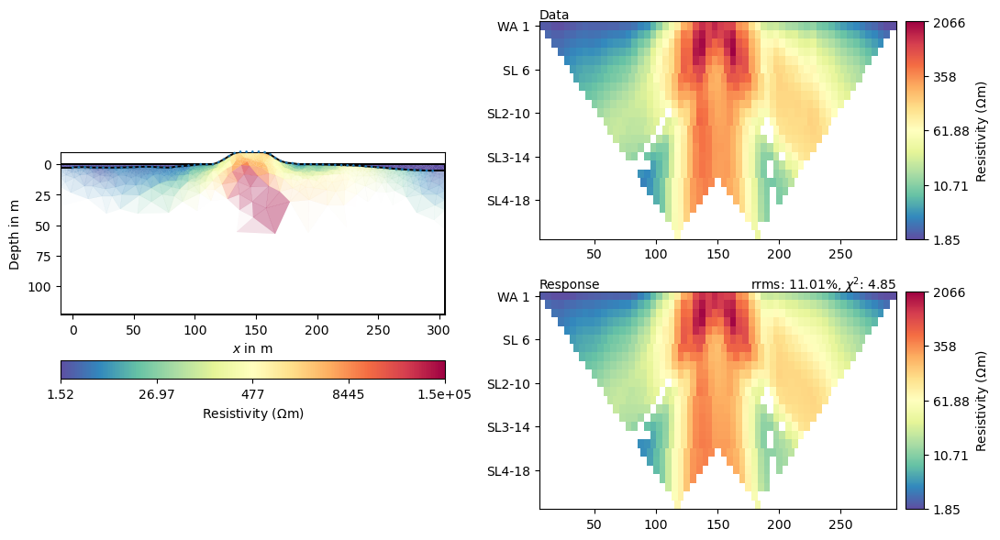

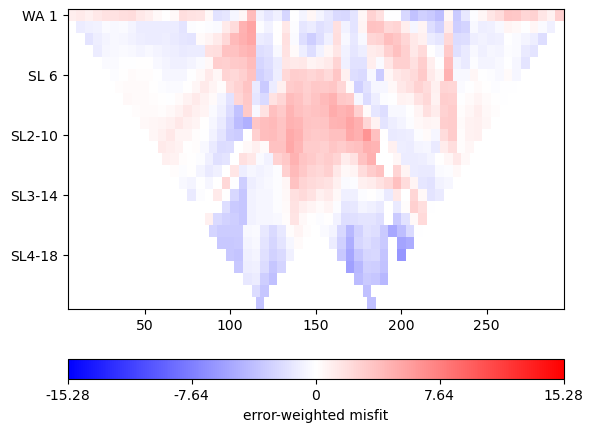

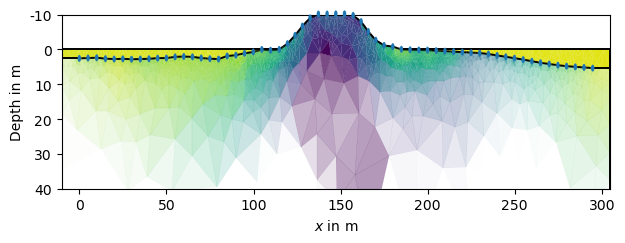

In [94]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, single=True)
mgr.inv.setRegularization(4, single=True)

inv = mgr.invert(lam=30, verbose=True, blockyModel=True, zWeight=0.5)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

ax, cb = mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r', colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

29/10/25 - 13:05:08 - pyGIMLi - INFO - Found 4 regions.
29/10/25 - 13:05:08 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
29/10/25 - 13:05:08 - pyGIMLi - INFO - Creating forward mesh from region infos.
29/10/25 - 13:05:09 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
29/10/25 - 13:05:09 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 8795 Cells: 16688 Boundaries: 12966
29/10/25 - 13:05:10 - pyGIMLi - INFO - Use median(data values)=77.18815899198106
29/10/25 - 13:05:10 - pyGIMLi - INFO - Created startmodel from forward operator:3936, min/max=77.188159/77.188159
29/10/25 - 13:05:10 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000028BE5280590>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 5.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 5.0
min/max (data): 1.85/2066
min/max (error): 5%/5.16%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1157.34
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  301.95 (dPhi = 73.49%) lam: 30.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   69.53 (dPhi = 76.66%) lam: 30.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   13.22 (dPhi = 77.91%) lam: 30.0
-----

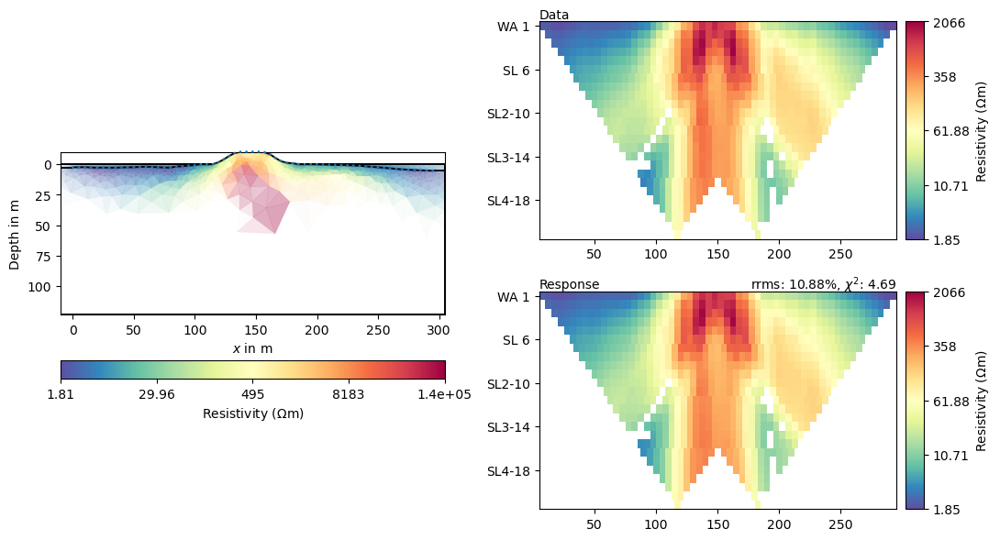

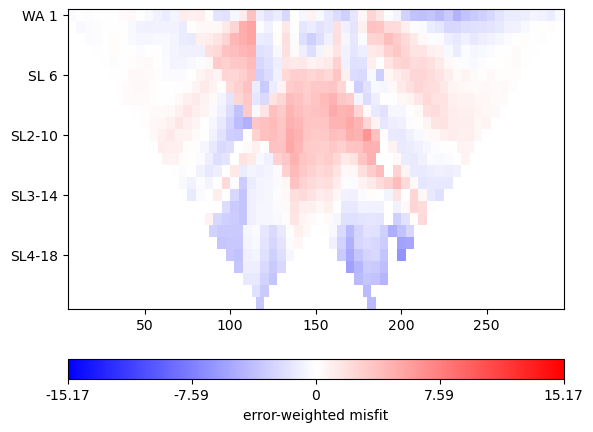

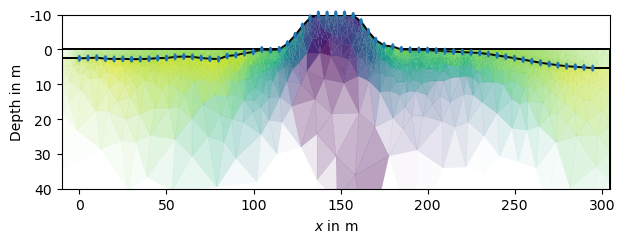

In [93]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, limits=[0, 5], trans="log")
mgr.inv.setRegularization(4, limits=[0, 5], trans="log")

inv = mgr.invert(lam=30, verbose=True, blockyModel=True, zWeight=0.5)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

ax, cb = mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r', colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

29/10/25 - 12:57:19 - pyGIMLi - INFO - Found 4 regions.
29/10/25 - 12:57:19 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
29/10/25 - 12:57:19 - pyGIMLi - INFO - Creating forward mesh from region infos.
29/10/25 - 12:57:20 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
29/10/25 - 12:57:20 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 8795 Cells: 16688 Boundaries: 12966
29/10/25 - 12:57:20 - pyGIMLi - INFO - Use median(data values)=77.18815899198106
29/10/25 - 12:57:20 - pyGIMLi - INFO - Created startmodel from forward operator:3936, min/max=77.188159/77.188159
29/10/25 - 12:57:20 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000028BE5280590>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 5.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 5.0
min/max (data): 1.85/2066
min/max (error): 5%/5.16%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1157.34
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  301.95 (dPhi = 73.67%) lam: 30.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   70.43 (dPhi = 76.33%) lam: 30.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   16.30 (dPhi = 74.70%) lam: 30.0
-----

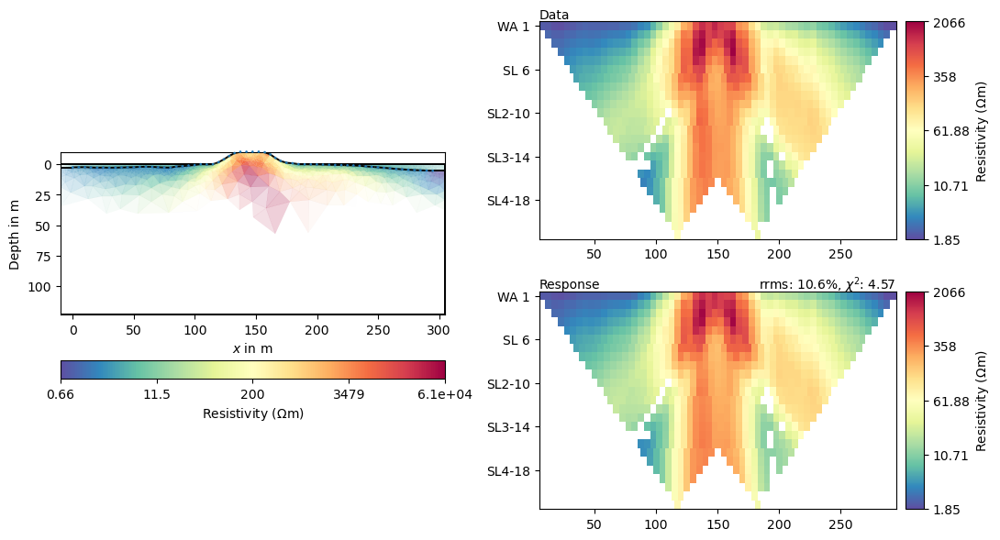

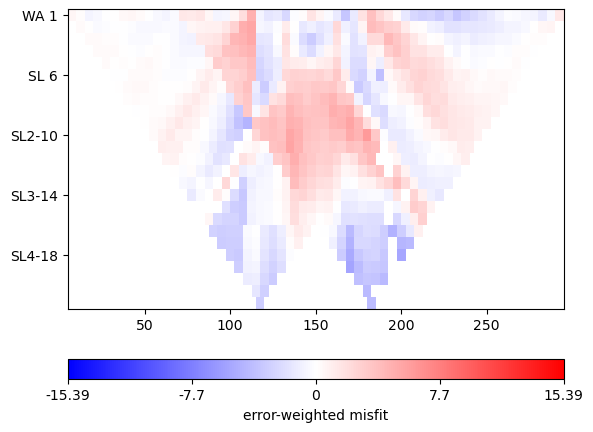

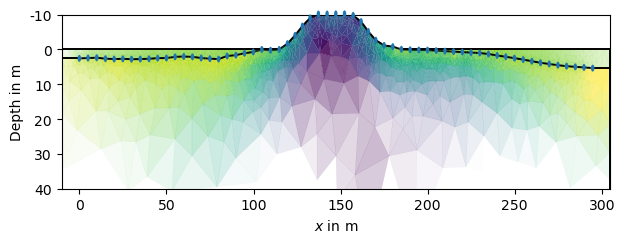

In [92]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, limits=[0, 5], trans="log")
mgr.inv.setRegularization(4, limits=[0, 5], trans="log")

inv = mgr.invert(lam=30, verbose=True, zWeight=0.5)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

ax, cb = mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r', colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

29/10/25 - 12:33:30 - pyGIMLi - INFO - Found 4 regions.
29/10/25 - 12:33:30 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
29/10/25 - 12:33:31 - pyGIMLi - INFO - Creating forward mesh from region infos.
29/10/25 - 12:33:31 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
29/10/25 - 12:33:31 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 8795 Cells: 16688 Boundaries: 12966
29/10/25 - 12:33:32 - pyGIMLi - INFO - Use median(data values)=77.18815899198106
29/10/25 - 12:33:32 - pyGIMLi - INFO - Created startmodel from forward operator:3936, min/max=77.188159/77.188159
29/10/25 - 12:33:32 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000028C46DB0590>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 5.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 5.0
min/max (data): 1.85/2066
min/max (error): 3%/7.97%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2937.44
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  828.14 (dPhi = 71.66%) lam: 30.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  176.35 (dPhi = 78.50%) lam: 30.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   39.04 (dPhi = 76.46%) lam: 30.0
-----

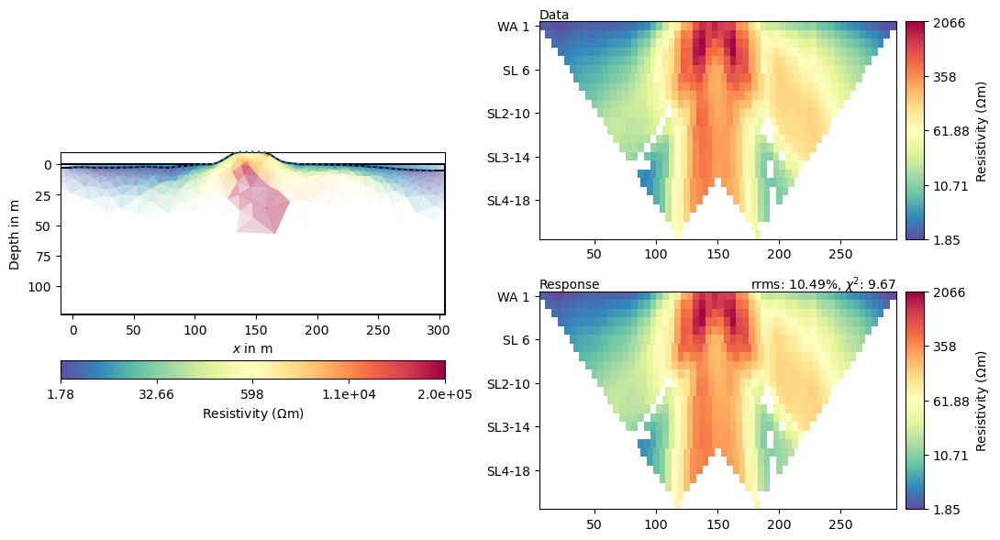

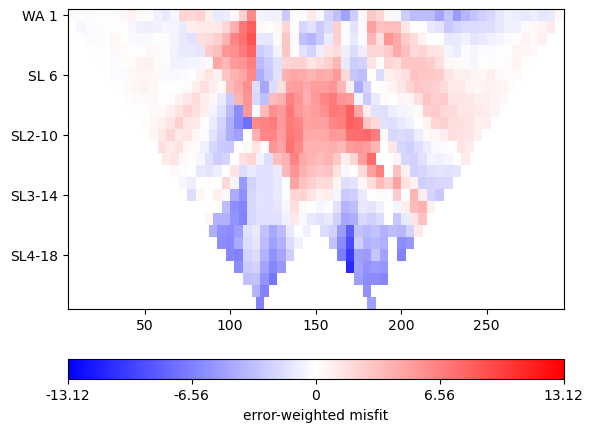

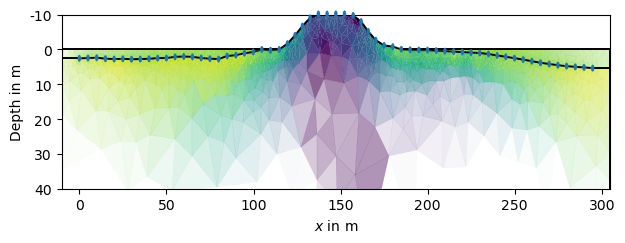

In [76]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, limits=[0, 5], trans="log")
mgr.inv.setRegularization(4, limits=[0, 5], trans="log")

inv = mgr.invert(lam=30, verbose=True, blockyModel=True, zWeight=0.5)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

ax, cb = mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r', colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

29/10/25 - 11:31:20 - pyGIMLi - INFO - Found 2 regions.
29/10/25 - 11:31:20 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
29/10/25 - 11:31:20 - pyGIMLi - INFO - Creating forward mesh from region infos.
29/10/25 - 11:31:21 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
29/10/25 - 11:31:21 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 11595 Cells: 22688 Boundaries: 17266
29/10/25 - 11:31:23 - pyGIMLi - INFO - Use median(data values)=77.18887327826026
29/10/25 - 11:31:23 - pyGIMLi - INFO - Created startmodel from forward operator:4081, min/max=77.188873/77.188873
29/10/25 - 11:31:23 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000028BD865CAE0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.85/2066
min/max (error): 2%/2.16%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 7448.41
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 2269.77 (dPhi = 69.44%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  503.38 (dPhi = 77.70%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =  132.45 (dPhi = 73.33%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   49.45 (dPhi = 61.38%) lam:

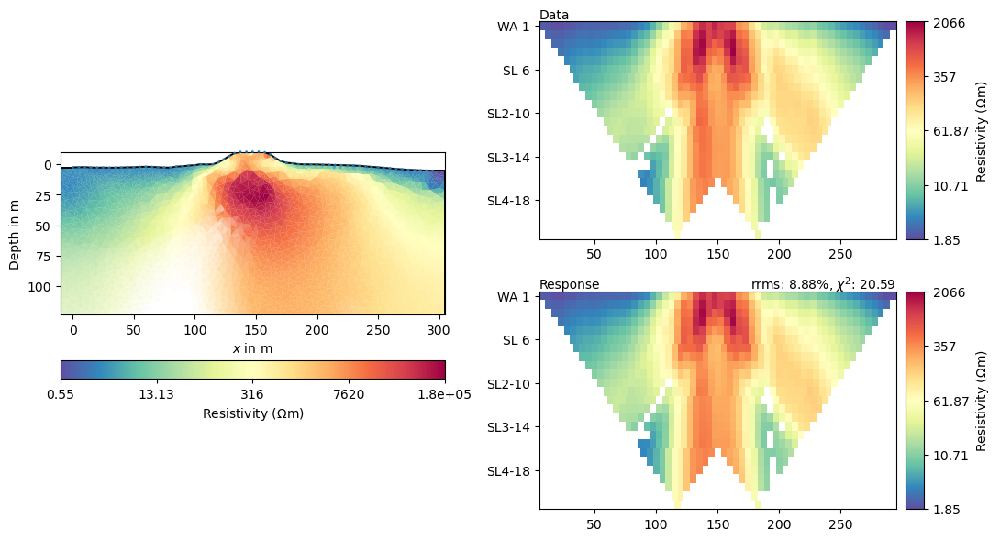

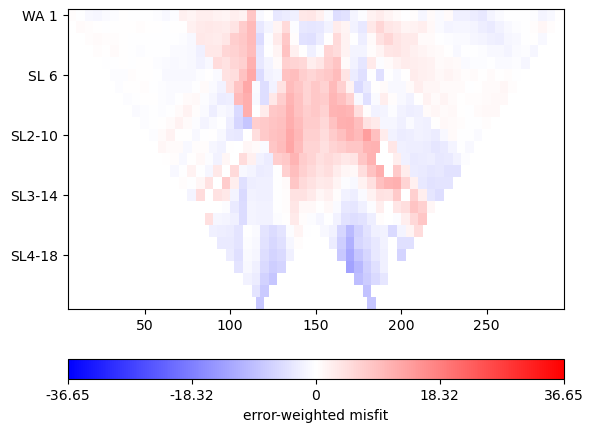

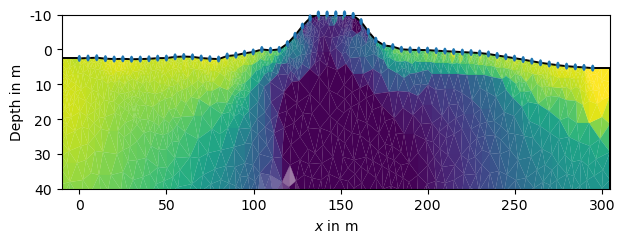

In [30]:
mgr.setMesh(mesh)

inv = mgr.invert(lam=20, verbose=True, blockyModel=True, zWeight=0.5)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

ax, cb = mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r', colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

03/11/25 - 16:08:39 - pyGIMLi - INFO - Found 4 regions.
03/11/25 - 16:08:39 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
03/11/25 - 16:08:39 - pyGIMLi - INFO - Creating forward mesh from region infos.
03/11/25 - 16:08:40 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
03/11/25 - 16:08:42 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 26348 Cells: 51652 Boundaries: 39260
03/11/25 - 16:08:43 - pyGIMLi - INFO - Use median(data values)=77.18887327826026
03/11/25 - 16:08:43 - pyGIMLi - INFO - Created startmodel from forward operator:11432, min/max=77.188873/77.188873
03/11/25 - 16:08:43 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000028CB873B420>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.1, upper bound 1.3
	 2 Logarithmic LU transform, lower bound 0.1, upper bound 2.5
min/max (data): 1.85/2066
min/max (error): 5%/9.97%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1090.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  305.27 (dPhi = 71.79%) lam: 30.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   56.31 (dPhi = 81.21%) lam: 30.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   14.05 (dPhi = 72.63%) lam: 30.0
-----

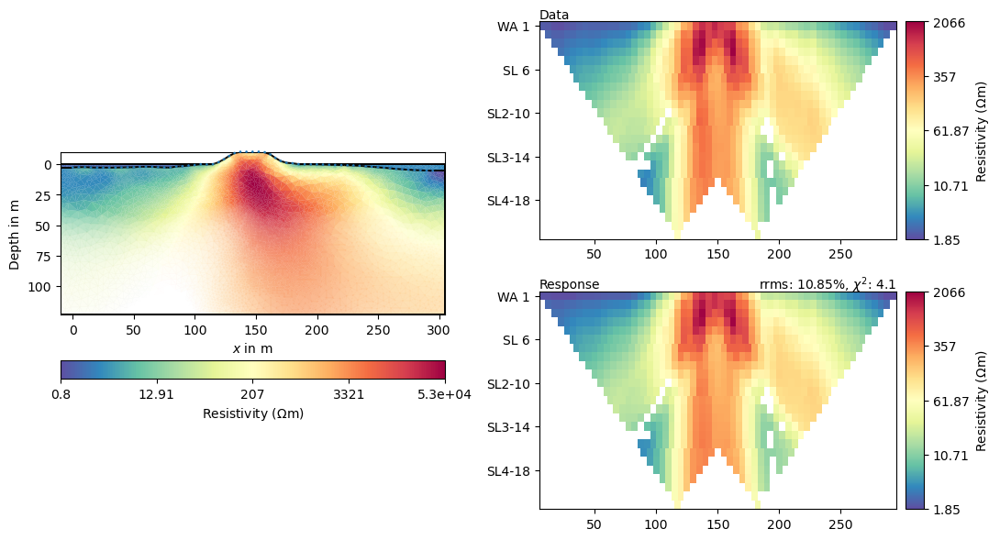

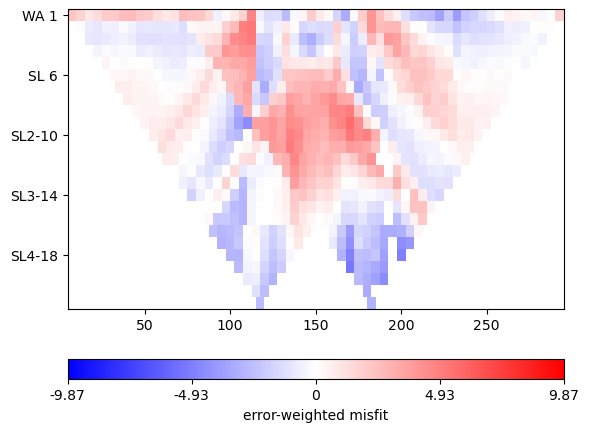

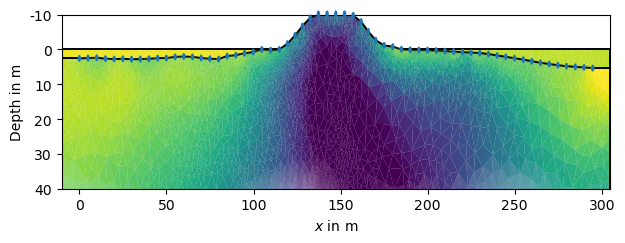

In [194]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, limits=[0.1, 1.3], trans="log")
mgr.inv.setRegularization(4, limits=[0.1, 2.5], trans="log")

inv = mgr.invert(lam=30, verbose=True, zWeight=0.5)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

ax, cb = mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r', colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

03/11/25 - 15:40:56 - pyGIMLi - INFO - Found 4 regions.
03/11/25 - 15:40:56 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
03/11/25 - 15:40:59 - pyGIMLi - INFO - Creating forward mesh from region infos.
03/11/25 - 15:41:00 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
03/11/25 - 15:41:04 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 26348 Cells: 51652 Boundaries: 39260
03/11/25 - 15:41:06 - pyGIMLi - INFO - Use median(data values)=77.18889136399005
03/11/25 - 15:41:06 - pyGIMLi - INFO - Created startmodel from forward operator:11432, min/max=77.188891/77.188891
03/11/25 - 15:41:06 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000028C8F0B8590>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.1, upper bound 1.3
	 2 Logarithmic LU transform, lower bound 0.1, upper bound 2.5
min/max (data): 1.85/2066
min/max (error): 5%/9.97%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1090.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  303.56 (dPhi = 71.89%) lam: 30.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   52.71 (dPhi = 82.31%) lam: 30.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   12.18 (dPhi = 73.92%) lam: 30.0
-----

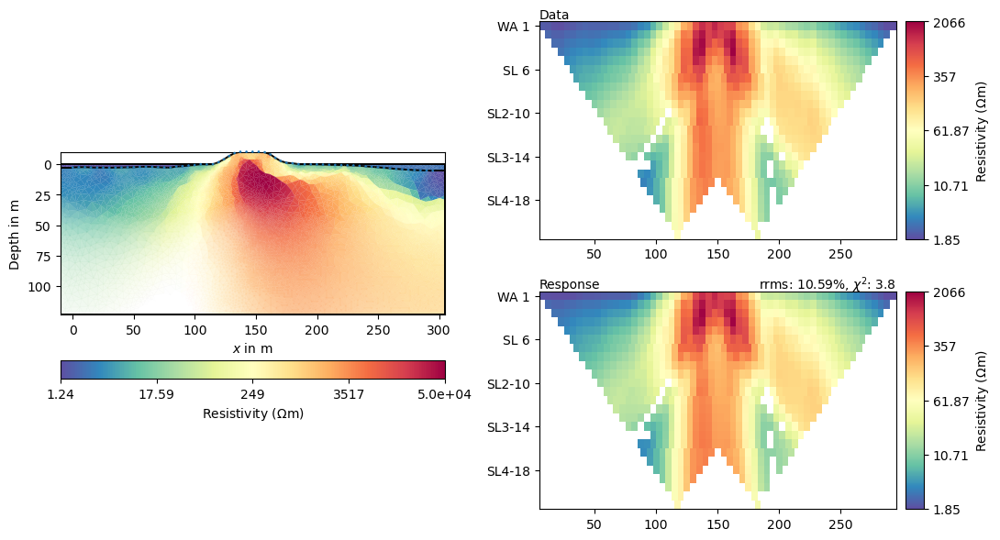

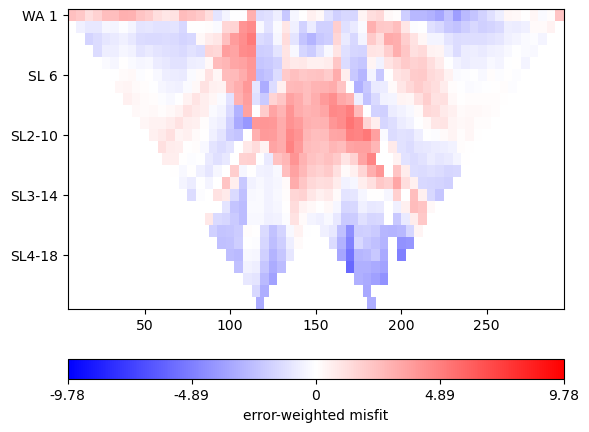

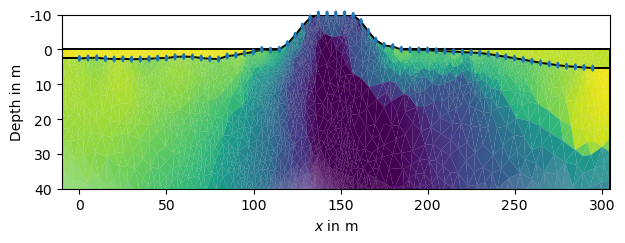

In [177]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, limits=[0.1, 1.3], trans="log")
mgr.inv.setRegularization(4, limits=[0.1, 2.5], trans="log")

inv = mgr.invert(lam=30, verbose=True)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

ax, cb = mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r', colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

28/10/25 - 16:27:05 - pyGIMLi - INFO - Found 4 regions.
28/10/25 - 16:27:05 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
28/10/25 - 16:27:05 - pyGIMLi - INFO - Creating forward mesh from region infos.
28/10/25 - 16:27:07 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
28/10/25 - 16:27:09 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 26348 Cells: 51652 Boundaries: 39260
28/10/25 - 16:27:11 - pyGIMLi - INFO - Use median(data values)=77.18887327826026
28/10/25 - 16:27:11 - pyGIMLi - INFO - Created startmodel from forward operator:11432, min/max=77.188873/77.188873
28/10/25 - 16:27:11 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000002599BDA0B30>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.1, upper bound 1.3
	 2 Logarithmic LU transform, lower bound 0.1, upper bound 2.5
min/max (data): 1.85/2066
min/max (error): 2%/2.03%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 7157.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 1998.27 (dPhi = 71.91%) lam: 100.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  225.85 (dPhi = 81.69%) lam: 100.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   57.48 (dPhi = 74.26%) lam: 100.0
--

28/10/25 - 17:01:07 - pyGIMLi - INFO - Use median(data values)=77.18887327826026
28/10/25 - 17:01:07 - pyGIMLi - INFO - Created startmodel from forward operator:11432, min/max=77.188873/77.188873
28/10/25 - 17:01:07 - pyGIMLi - INFO - Starting inversion.


chi² =    8.92 (dPhi = 0.32%) lam: 100.0
################################################################################
#                Abort criterion reached: dPhi = 0.32 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000002599BDA0B30>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.1, upper bound 1.3
	 2 Logarithmic LU transform, lower bound 0.1, upper bound 2.5
min/max (data): 1.85/2066
min/max (error): 2%/2.03%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 7157.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 2109.10 (dPhi = 70.39%) lam: 

28/10/25 - 17:41:55 - pyGIMLi - INFO - Use median(data values)=77.18887327826026
28/10/25 - 17:41:55 - pyGIMLi - INFO - Created startmodel from forward operator:11432, min/max=77.188873/77.188873
28/10/25 - 17:41:55 - pyGIMLi - INFO - Starting inversion.


chi² =    8.33 (dPhi = 0.98%) lam: 77.4
################################################################################
#                Abort criterion reached: dPhi = 0.98 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000002599BDA0B30>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.1, upper bound 1.3
	 2 Logarithmic LU transform, lower bound 0.1, upper bound 2.5
min/max (data): 1.85/2066
min/max (error): 2%/2.03%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 7157.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 2143.29 (dPhi = 69.93%) lam: 5

28/10/25 - 18:23:31 - pyGIMLi - INFO - Use median(data values)=77.18887327826026
28/10/25 - 18:23:31 - pyGIMLi - INFO - Created startmodel from forward operator:11432, min/max=77.188873/77.188873
28/10/25 - 18:23:31 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000002599BDA0B30>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.1, upper bound 1.3
	 2 Logarithmic LU transform, lower bound 0.1, upper bound 2.5
min/max (data): 1.85/2066
min/max (error): 2%/2.03%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 7157.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 2181.04 (dPhi = 69.42%) lam: 46.4
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  224.88 (dPhi = 83.22%) lam: 46.4
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   77.37 (dPhi = 68.55%) lam: 46.4
-----

28/10/25 - 19:10:11 - pyGIMLi - INFO - Use median(data values)=77.18887327826026
28/10/25 - 19:10:11 - pyGIMLi - INFO - Created startmodel from forward operator:11432, min/max=77.188873/77.188873
28/10/25 - 19:10:11 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000002599BDA0B30>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.1, upper bound 1.3
	 2 Logarithmic LU transform, lower bound 0.1, upper bound 2.5
min/max (data): 1.85/2066
min/max (error): 2%/2.03%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 7157.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 2198.54 (dPhi = 69.18%) lam: 35.9
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  231.18 (dPhi = 83.06%) lam: 35.9
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   84.52 (dPhi = 67.89%) lam: 35.9
-----

28/10/25 - 19:58:57 - pyGIMLi - INFO - Use median(data values)=77.18887327826026
28/10/25 - 19:58:57 - pyGIMLi - INFO - Created startmodel from forward operator:11432, min/max=77.188873/77.188873
28/10/25 - 19:58:57 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000002599BDA0B30>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.1, upper bound 1.3
	 2 Logarithmic LU transform, lower bound 0.1, upper bound 2.5
min/max (data): 1.85/2066
min/max (error): 2%/2.03%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 7157.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 2232.52 (dPhi = 68.72%) lam: 27.8
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  246.12 (dPhi = 82.77%) lam: 27.8
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   84.60 (dPhi = 69.98%) lam: 27.8
-----

28/10/25 - 20:40:48 - pyGIMLi - INFO - Use median(data values)=77.18887327826026
28/10/25 - 20:40:48 - pyGIMLi - INFO - Created startmodel from forward operator:11432, min/max=77.188873/77.188873
28/10/25 - 20:40:48 - pyGIMLi - INFO - Starting inversion.


chi² =    4.34 (dPhi = 1.63%) lam: 27.8
################################################################################
#                Abort criterion reached: dPhi = 1.63 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000002599BDA0B30>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.1, upper bound 1.3
	 2 Logarithmic LU transform, lower bound 0.1, upper bound 2.5
min/max (data): 1.85/2066
min/max (error): 2%/2.03%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 7157.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 2268.77 (dPhi = 68.23%) lam: 2

28/10/25 - 21:34:08 - pyGIMLi - INFO - Use median(data values)=77.18887327826026
28/10/25 - 21:34:08 - pyGIMLi - INFO - Created startmodel from forward operator:11432, min/max=77.188873/77.188873
28/10/25 - 21:34:08 - pyGIMLi - INFO - Starting inversion.


chi² =    3.26 (dPhi = 0.50%) lam: 21.5
################################################################################
#                 Abort criterion reached: dPhi = 0.5 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000002599BDA0B30>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.1, upper bound 1.3
	 2 Logarithmic LU transform, lower bound 0.1, upper bound 2.5
min/max (data): 1.85/2066
min/max (error): 2%/2.03%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 7157.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 2402.48 (dPhi = 66.37%) lam: 1

28/10/25 - 22:17:37 - pyGIMLi - INFO - Use median(data values)=77.18887327826026
28/10/25 - 22:17:37 - pyGIMLi - INFO - Created startmodel from forward operator:11432, min/max=77.188873/77.188873
28/10/25 - 22:17:37 - pyGIMLi - INFO - Starting inversion.


chi² =    3.06 (dPhi = 0.80%) lam: 16.7
################################################################################
#                 Abort criterion reached: dPhi = 0.8 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000002599BDA0B30>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.1, upper bound 1.3
	 2 Logarithmic LU transform, lower bound 0.1, upper bound 2.5
min/max (data): 1.85/2066
min/max (error): 2%/2.03%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 7157.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 2460.16 (dPhi = 65.57%) lam: 1

28/10/25 - 23:16:15 - pyGIMLi - INFO - Use median(data values)=77.18887327826026
28/10/25 - 23:16:15 - pyGIMLi - INFO - Created startmodel from forward operator:11432, min/max=77.188873/77.188873
28/10/25 - 23:16:15 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000002599BDA0B30>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.1, upper bound 1.3
	 2 Logarithmic LU transform, lower bound 0.1, upper bound 2.5
min/max (data): 1.85/2066
min/max (error): 2%/2.03%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 7157.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 2467.95 (dPhi = 65.47%) lam: 10.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  529.09 (dPhi = 72.33%) lam: 10.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =  208.31 (dPhi = 50.98%) lam: 10.0
-----

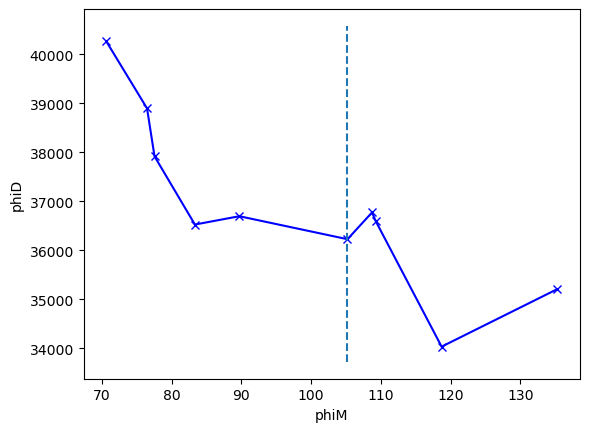

In [28]:
mgr.setMesh(mesh)


mgr.inv.setRegularization(3, limits=[0.1, 1.3], trans="log")
mgr.inv.setRegularization(4, limits=[0.1, 2.5], trans="log")


lambdas = np.logspace(np.log10(100), np.log10(10), num=10)
phiD = []
phiM = []
for lam in lambdas:
    mgr.invert(data, lam=lam, verbose=True, blockyModel=True, robustData=True)
    phiD.append(mgr.inv.phiData())
    phiM.append(mgr.inv.phiModel())

phiD = np.array(phiD)
phiM = np.array(phiM)

from kneed import DataGenerator, KneeLocator
kneedle = KneeLocator(phiM, phiD, online=True, curve="convex", direction="decreasing",interp_method='polynomial', polynomial_degree=2)

print(round(kneedle.elbow, 3))
print(round(kneedle.elbow_y, 3))
print(lambdas[np.where(phiM==kneedle.elbow)[0]])

plt.xlabel('phiM')
plt.ylabel('phiD')
plt.plot(phiM, phiD, 'bx-')
plt.vlines(kneedle.elbow, plt.ylim()[0], plt.ylim()[1], linestyles='dashed')

Elbow (x): 105.223
Elbow (y): 36226.978
[27.82559402]


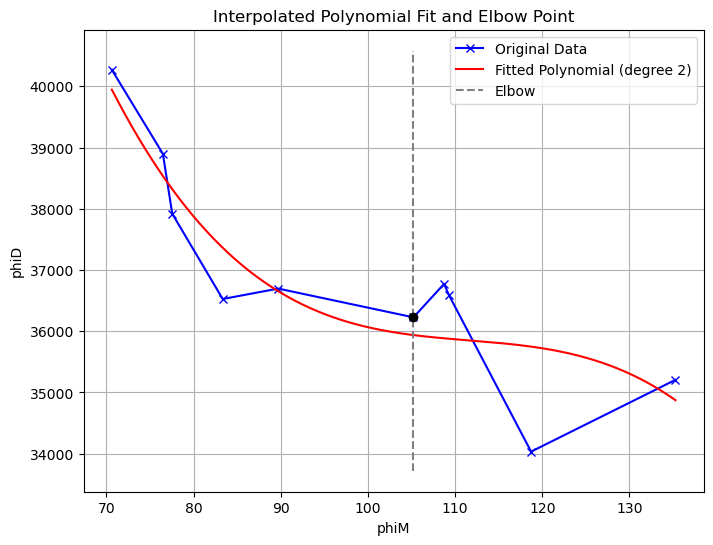

In [36]:
import numpy as np
import matplotlib.pyplot as plt
from kneed import KneeLocator

kneedle = KneeLocator(
    phiM, phiD,
    online=True,
    curve="convex",
    direction="decreasing",
    interp_method='polynomial',
    polynomial_degree=2
)

# --- Print knee location ---
print("Elbow (x):", round(kneedle.elbow, 3))
print("Elbow (y):", round(kneedle.elbow_y, 3))
print(lambdas[np.where(phiM==kneedle.elbow)[0]])
# --- Recreate the interpolated polynomial fit manually ---
degree = 3  # same as polynomial_degree
coeffs = np.polyfit(phiM, phiD, degree)
poly = np.poly1d(coeffs)

# Generate smooth fitted curve
phiM_fit = np.linspace(min(phiM), max(phiM), 1000)
phiD_fit = poly(phiM_fit)

# --- Plot ---
plt.figure(figsize=(8,6))
plt.plot(phiM, phiD, 'bx-', label='Original Data')
plt.plot(phiM_fit, phiD_fit, 'r-', label='Fitted Polynomial (degree 2)')
plt.vlines(kneedle.elbow, plt.ylim()[0], plt.ylim()[1], linestyles='dashed', color='gray', label='Elbow')
plt.scatter(kneedle.elbow, kneedle.elbow_y, color='black', zorder=5)

plt.xlabel('phiM')
plt.ylabel('phiD')
plt.legend()
plt.title('Interpolated Polynomial Fit and Elbow Point')
plt.grid(True)
plt.show()

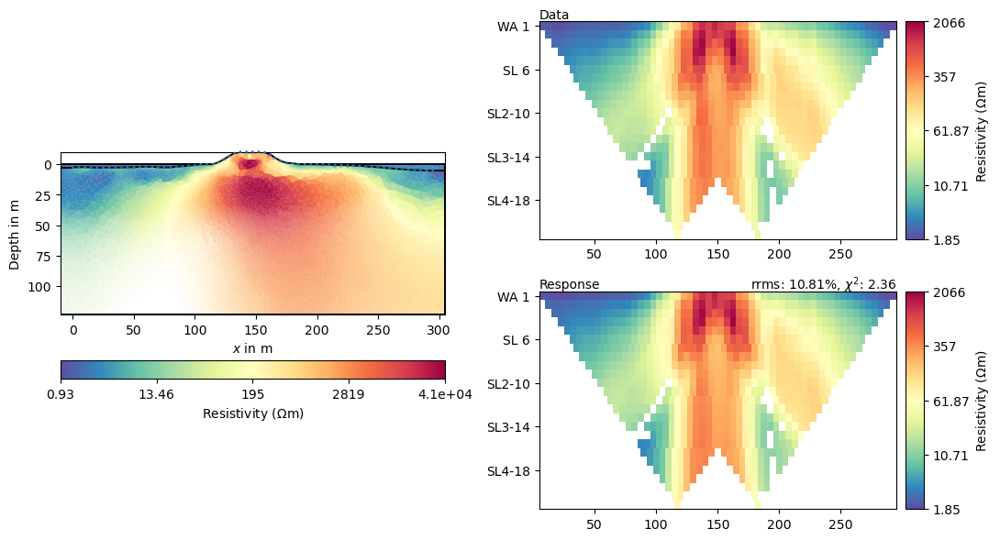

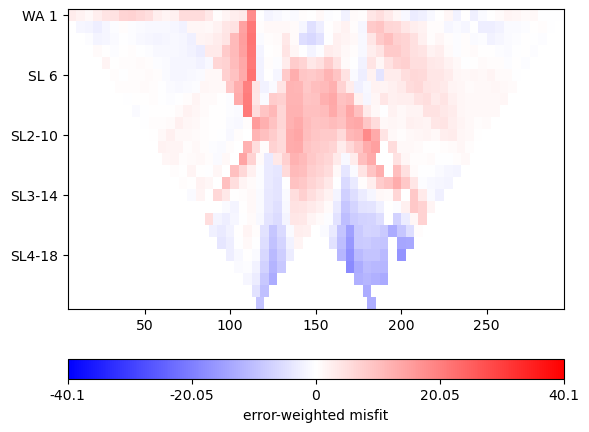

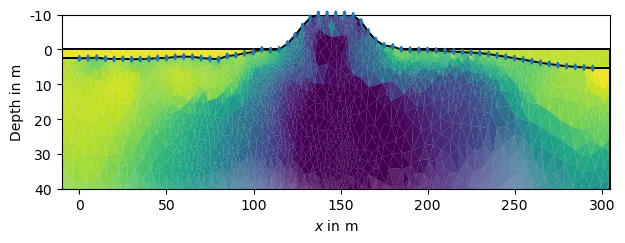

In [31]:
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

ax, cb = mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r', colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

28/10/25 - 14:44:44 - pyGIMLi - INFO - Found 4 regions.
28/10/25 - 14:44:44 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
28/10/25 - 14:44:44 - pyGIMLi - INFO - Creating forward mesh from region infos.
28/10/25 - 14:44:45 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
28/10/25 - 14:44:45 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 8795 Cells: 16688 Boundaries: 12966
28/10/25 - 14:44:45 - pyGIMLi - INFO - Use median(data values)=77.18815899198106
28/10/25 - 14:44:45 - pyGIMLi - INFO - Created startmodel from forward operator:3071, min/max=77.188159/77.188159
28/10/25 - 14:44:45 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000013E31D095D0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.85/2066
min/max (error): 2%/2.5%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 7112.04
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 2234.57 (dPhi = 68.48%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  378.82 (dPhi = 74.33%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =  155.44 (dPhi = 45.88%) lam: 20.0
------

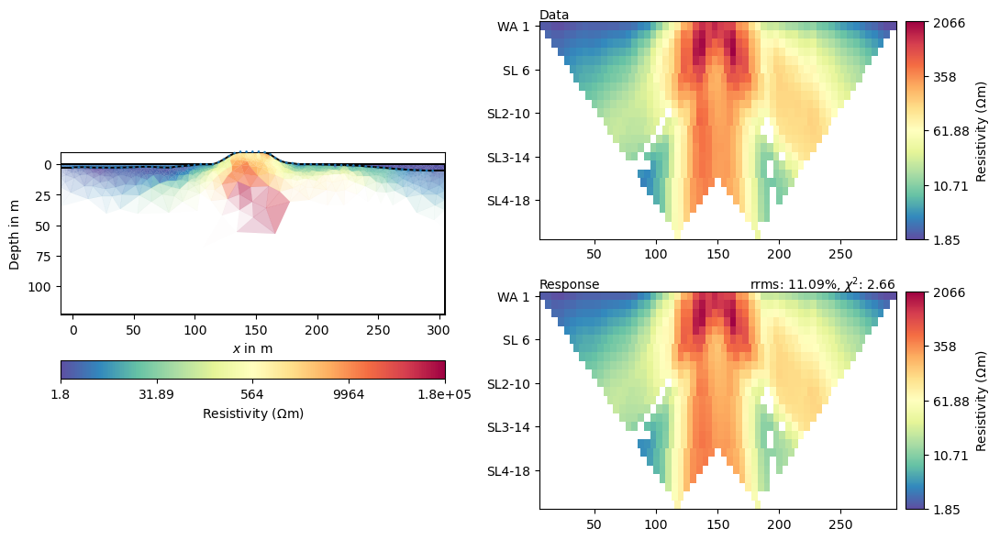

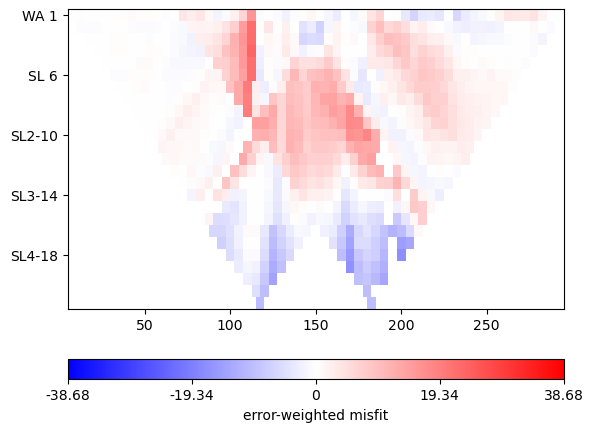

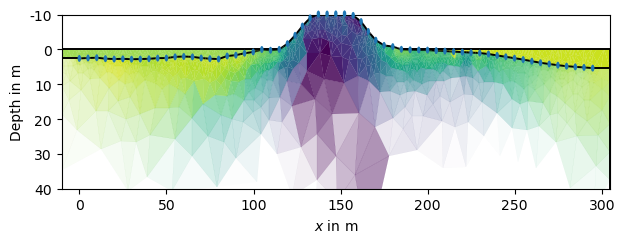

In [22]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, single=True)
mgr.inv.setRegularization(4, single=True)

inv = mgr.invert(lam=20, verbose=True, blockyModel=True, robustData=True)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

ax, cb = mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r', colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

28/10/25 - 14:36:08 - pyGIMLi - INFO - Found 4 regions.
28/10/25 - 14:36:08 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
28/10/25 - 14:36:08 - pyGIMLi - INFO - Creating forward mesh from region infos.
28/10/25 - 14:36:08 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
28/10/25 - 14:36:08 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 8795 Cells: 16688 Boundaries: 12966
28/10/25 - 14:36:09 - pyGIMLi - INFO - Use median(data values)=77.18815899198106
28/10/25 - 14:36:09 - pyGIMLi - INFO - Created startmodel from forward operator:3936, min/max=77.188159/77.188159
28/10/25 - 14:36:09 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000013E31D095D0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.85/2066
min/max (error): 2%/2.5%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 7112.04
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 3974.18 (dPhi = 44.11%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² = 1335.66 (dPhi = 59.53%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =  478.52 (dPhi = 45.92%) lam: 20.0
------

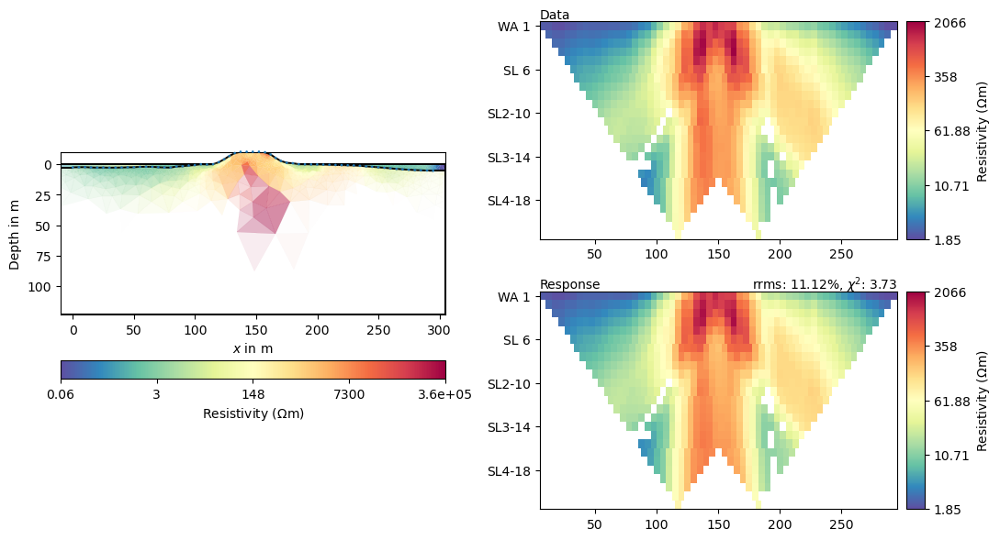

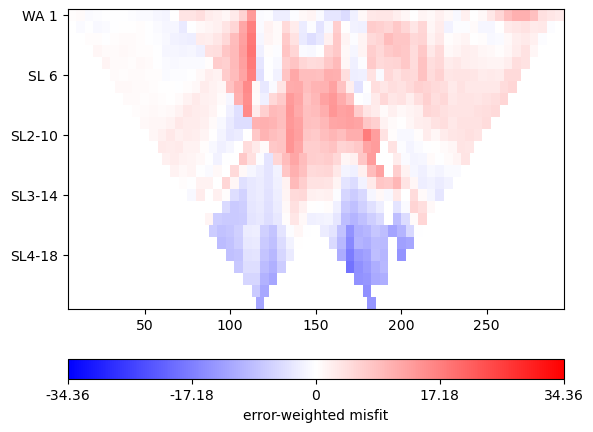

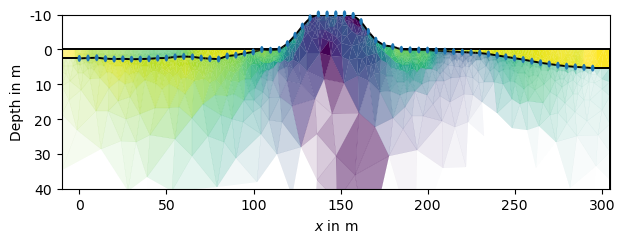

In [21]:
mgr.setMesh(mesh)

inv = mgr.invert(lam=20, verbose=True, blockyModel=True, robustData=True)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

ax, cb = mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r', colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

28/10/25 - 14:29:52 - pyGIMLi - INFO - Found 4 regions.
28/10/25 - 14:29:52 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
28/10/25 - 14:29:52 - pyGIMLi - INFO - Creating forward mesh from region infos.
28/10/25 - 14:29:52 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
28/10/25 - 14:29:53 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 8795 Cells: 16688 Boundaries: 12966
28/10/25 - 14:29:53 - pyGIMLi - INFO - Use median(data values)=77.18815899198106
28/10/25 - 14:29:53 - pyGIMLi - INFO - Created startmodel from forward operator:3069, min/max=77.188159/77.188159
28/10/25 - 14:29:53 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000013E31D095D0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.85/2066
min/max (error): 2%/2.5%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 4713.13
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 3051.29 (dPhi = 35.24%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  666.17 (dPhi = 70.80%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =  122.27 (dPhi = 81.49%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   66.43 (dPhi = 14.25%) lam: 

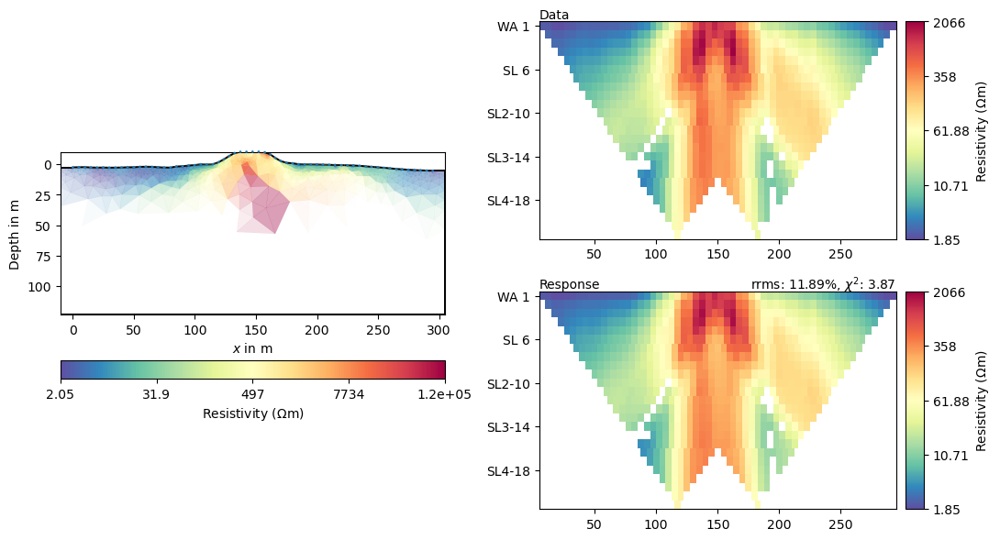

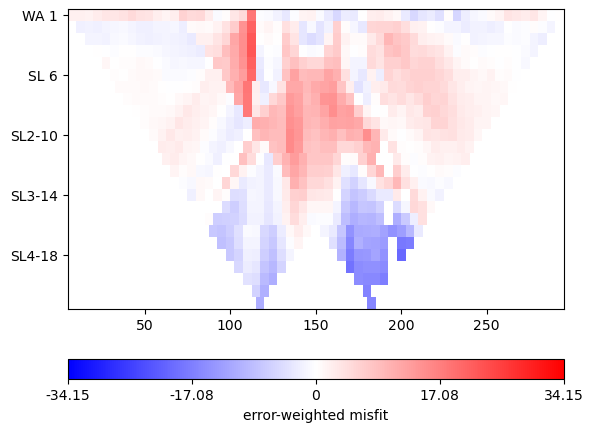

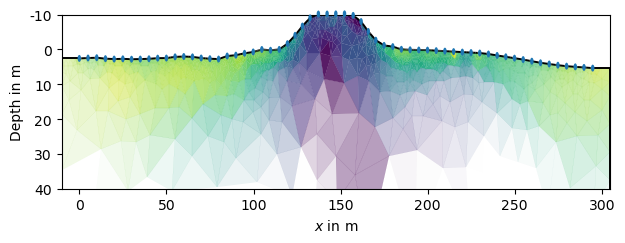

In [20]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, fix=1.5)
mgr.inv.setRegularization(4, fix=2)

inv = mgr.invert(lam=20, verbose=True, blockyModel=True, robustData=True)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

ax, cb = mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r', colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

28/10/25 - 14:20:13 - pyGIMLi - INFO - Found 4 regions.
28/10/25 - 14:20:13 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
28/10/25 - 14:20:13 - pyGIMLi - INFO - Creating forward mesh from region infos.
28/10/25 - 14:20:14 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
28/10/25 - 14:20:14 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 8795 Cells: 16688 Boundaries: 12966
28/10/25 - 14:20:14 - pyGIMLi - INFO - Use median(data values)=77.18815899198106
28/10/25 - 14:20:14 - pyGIMLi - INFO - Created startmodel from forward operator:3936, min/max=77.188159/77.188159
28/10/25 - 14:20:14 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000013E31D095D0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 1.85/2066
min/max (error): 2%/2.5%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 7112.04
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 3901.84 (dPhi = 45.12%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² = 1268.26 (dPhi = 60.18%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =  568.47 (dPhi = 32.29%) lam: 20.0
------

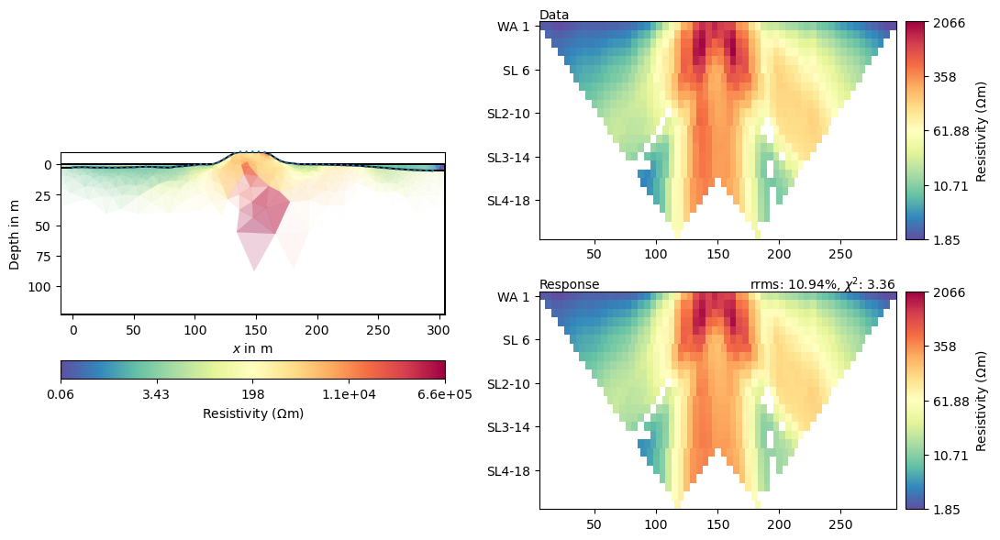

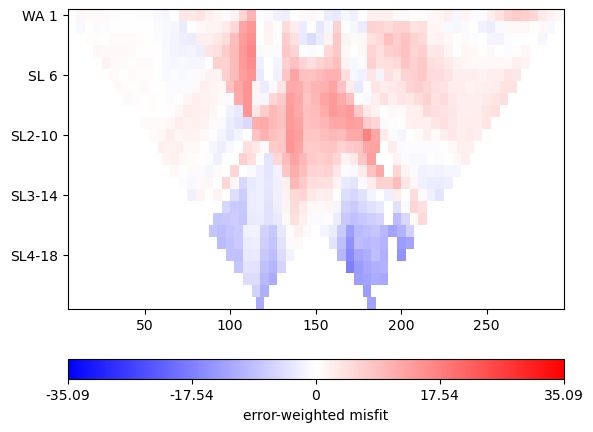

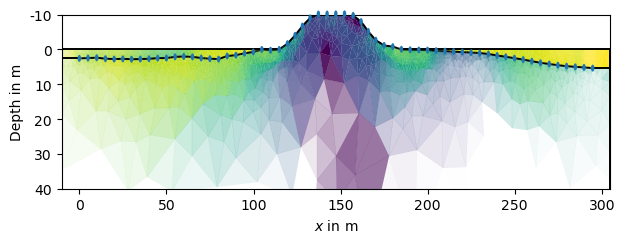

In [ ]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, limits=[0, 0], trans="log")
mgr.inv.setRegularization(4, limits=[0, 0], trans="log")
mgr.inv.setRegularization(2)
inv = mgr.invert(lam=20, verbose=True, blockyModel=True, robustData=True)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

ax, cb = mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r', colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

28/10/25 - 14:09:32 - pyGIMLi - INFO - Found 4 regions.
28/10/25 - 14:09:32 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
28/10/25 - 14:09:32 - pyGIMLi - INFO - Creating forward mesh from region infos.
28/10/25 - 14:09:33 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
28/10/25 - 14:09:33 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 8795 Cells: 16688 Boundaries: 12966
28/10/25 - 14:09:34 - pyGIMLi - INFO - Use median(data values)=77.18815899198106
28/10/25 - 14:09:34 - pyGIMLi - INFO - Created startmodel from forward operator:3936, min/max=77.188159/77.188159
28/10/25 - 14:09:34 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000013E31D095D0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 2.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 2.0
min/max (data): 1.85/2066
min/max (error): 2%/2.5%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 7112.04
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 2267.88 (dPhi = 68.04%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  296.51 (dPhi = 78.89%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   72.78 (dPhi = 79.18%) lam: 20.0
------

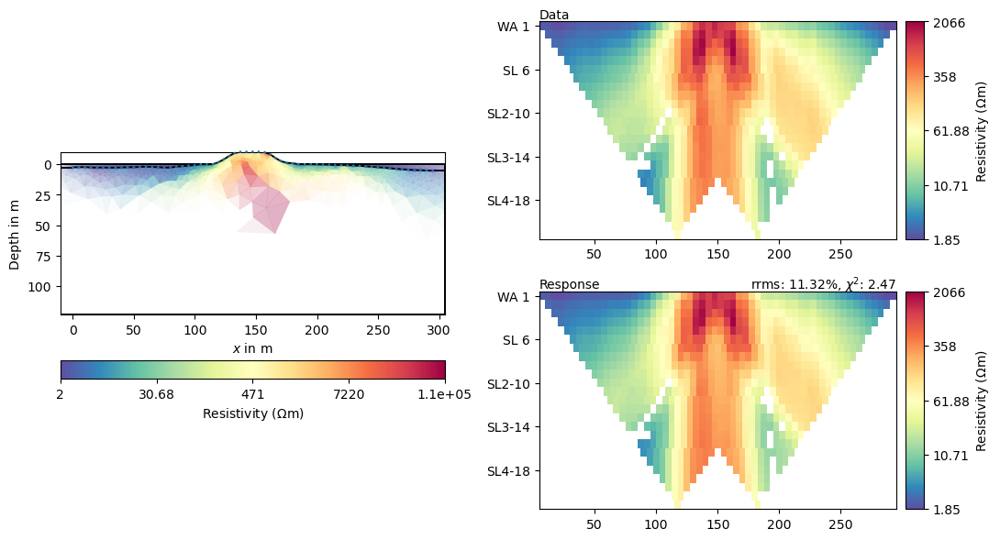

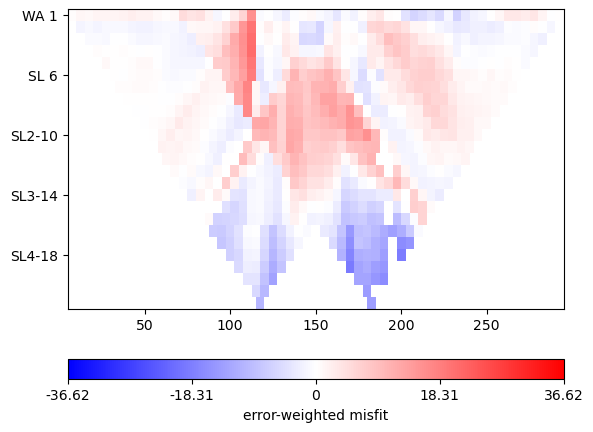

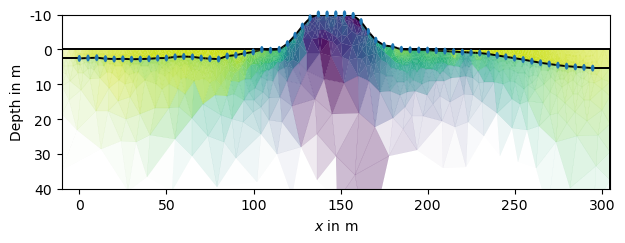

In [18]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, limits=[0, 2], trans="log")
mgr.inv.setRegularization(4, limits=[0, 2], trans="log")
mgr.inv.setRegularization(2)
inv = mgr.invert(lam=20, verbose=True, blockyModel=True, robustData=True)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

ax, cb = mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r', colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

28/10/25 - 10:55:06 - pyGIMLi - INFO - Found 4 regions.
28/10/25 - 10:55:06 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
28/10/25 - 10:55:06 - pyGIMLi - INFO - Creating forward mesh from region infos.
28/10/25 - 10:55:07 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
28/10/25 - 10:55:08 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 21600 Cells: 42292 Boundaries: 32172
28/10/25 - 10:55:09 - pyGIMLi - INFO - Use median(data values)=77.1880866879927
28/10/25 - 10:55:09 - pyGIMLi - INFO - Created startmodel from forward operator:9507, min/max=77.188087/77.188087
28/10/25 - 10:55:09 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000001CB85304EA0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.0, upper bound 2.0
	 2 Logarithmic LU transform, lower bound 0.0, upper bound 2.0
min/max (data): 1.85/2066
min/max (error): 3%/3.03%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3216.50
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 1004.93 (dPhi = 68.65%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  121.03 (dPhi = 87.83%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   30.34 (dPhi = 73.50%) lam: 20.0
-----

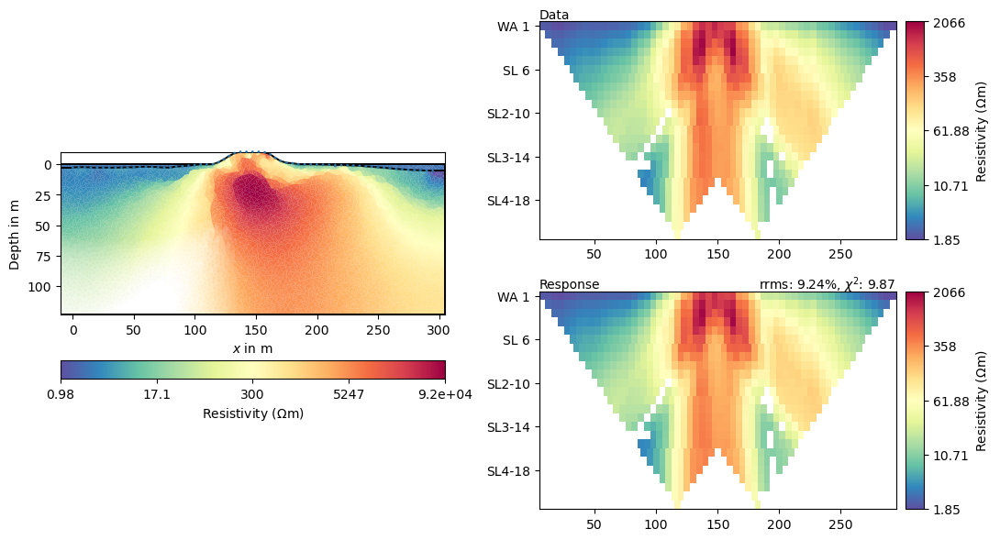

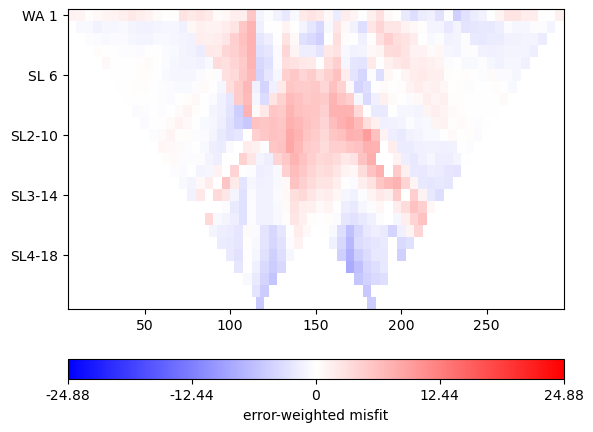

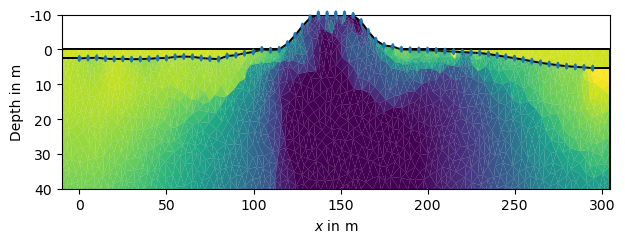

In [50]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, limits=[0, 2], trans="log")
mgr.inv.setRegularization(4, limits=[0, 2], trans="log")
mgr.inv.setRegularization(2)
inv = mgr.invert(lam=20, verbose=True, blockyModel=True)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

ax, cb = mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r', colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

(<Axes: xlabel='$x$ in m', ylabel='Depth in m'>,
 <matplotlib.colorbar.Colorbar at 0x28c46d91b50>)

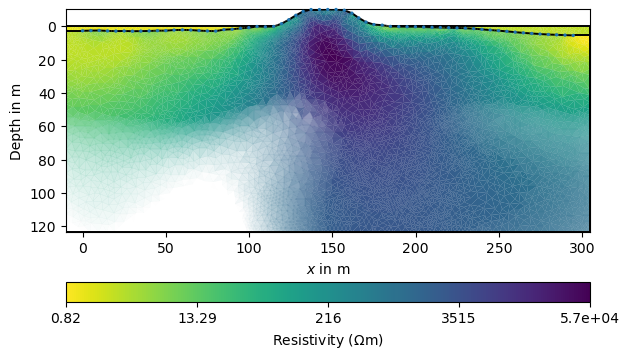

In [201]:
mgr.showResult(cMap="viridis_r", logScale=True)

(<Axes: xlabel='$x$ in m', ylabel='Depth in m'>,
 <matplotlib.colorbar.Colorbar at 0x28cb87ba710>)

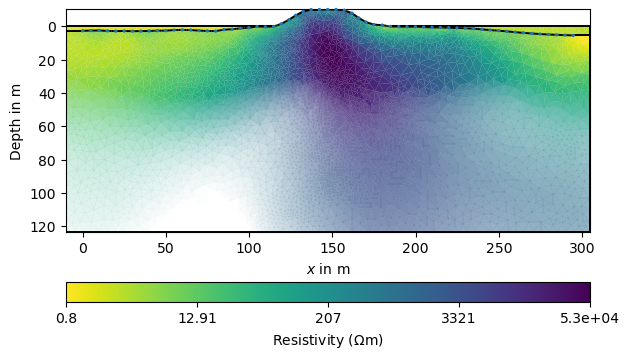

In [195]:
mgr.showResult(cMap="viridis_r", logScale=True)

(<Axes: xlabel='$x$ in m', ylabel='Depth in m'>,
 <matplotlib.colorbar.Colorbar at 0x28c48bb4790>)

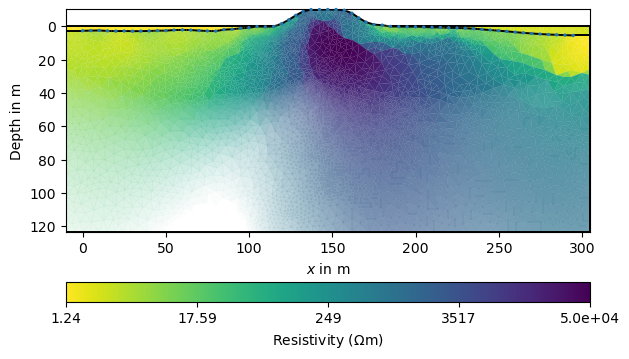

In [178]:
mgr.showResult(cMap="viridis_r", logScale=True)

03/11/25 - 16:38:40 - pyGIMLi - INFO - Saving inversion results to: //smb.isipd.dmawi.de/projects/p_subaqua/Expeditions/2023/NWT2023/analysis_Tuk/Tuk_all_mehriban/pygimli/all_inversions/INV_western_new_rhoa_updated\ERTManager


Path //smb.isipd.dmawi.de/projects/p_subaqua/Expeditions/2023/NWT2023/analysis_Tuk/Tuk_all_mehriban/pygimli/all_inversions/INV_western_new_rhoa_updated\ERTManager already exists. Skipping


('//smb.isipd.dmawi.de/projects/p_subaqua/Expeditions/2023/NWT2023/analysis_Tuk/Tuk_all_mehriban/pygimli/all_inversions/INV_western_new_rhoa_updated\\ERTManager',
 <Figure size 1600x1000 with 2 Axes>,
 <Axes: xlabel='$x$ in m', ylabel='Depth in m'>)

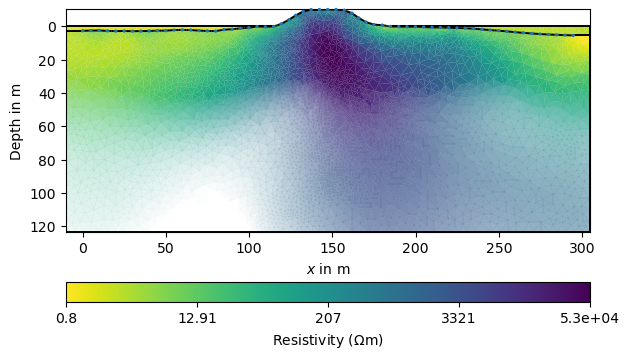

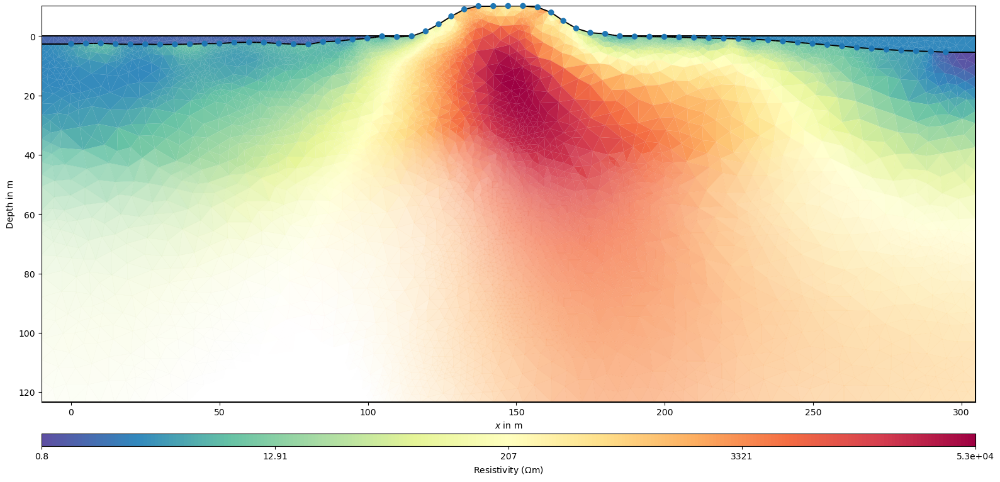

In [196]:
mgr.showResult(cMap="viridis_r", logScale=True)
mgr.saveResult(dir + 'pygimli/all_inversions/INV_western_new_rhoa_updated')

04/11/25 - 14:36:15 - pyGIMLi - INFO - Found 4 regions.
04/11/25 - 14:36:15 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
04/11/25 - 14:36:16 - pyGIMLi - INFO - Creating forward mesh from region infos.
04/11/25 - 14:36:16 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
04/11/25 - 14:36:19 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 29679 Cells: 58312 Boundaries: 44256
04/11/25 - 14:36:21 - pyGIMLi - INFO - Use median(data values)=77.18892977300482
04/11/25 - 14:36:21 - pyGIMLi - INFO - Created startmodel from forward operator:12712, min/max=77.188930/77.188930
04/11/25 - 14:36:21 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000028CB873B420>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.1, upper bound 1.3
	 2 Logarithmic LU transform, lower bound 0.1, upper bound 2.5
min/max (data): 1.85/2066
min/max (error): 5%/9.97%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1090.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  306.46 (dPhi = 71.69%) lam: 30.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   55.86 (dPhi = 81.43%) lam: 30.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   13.38 (dPhi = 73.56%) lam: 30.0
-----

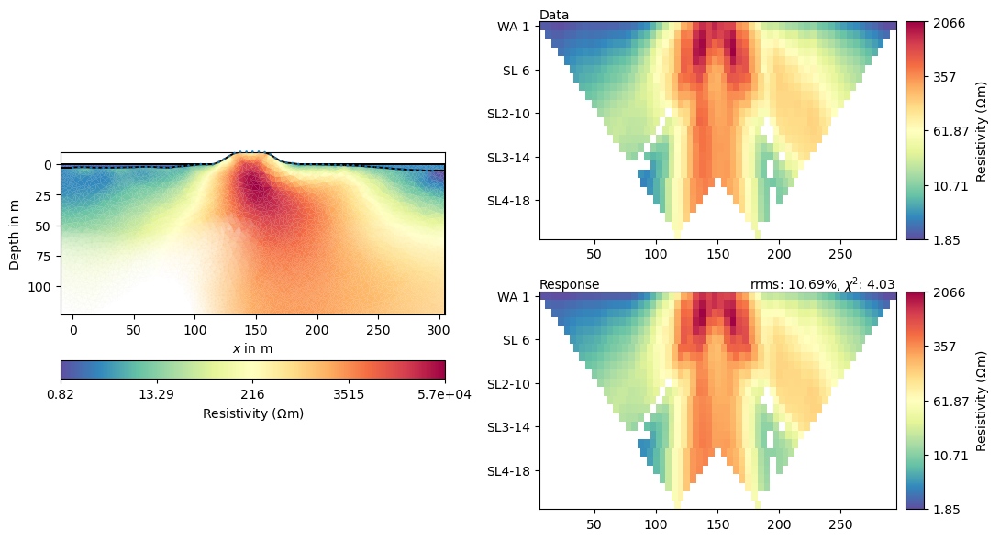

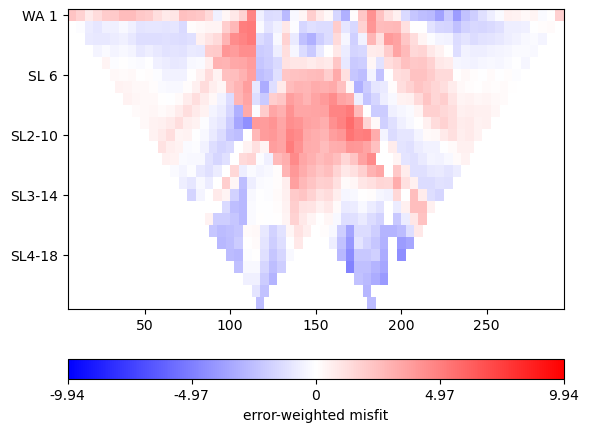

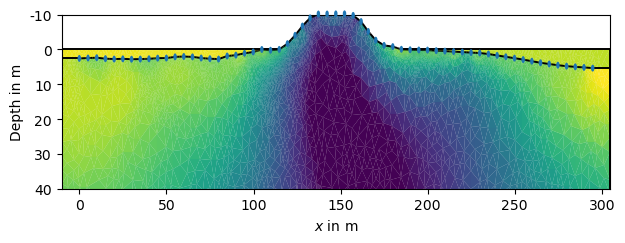

In [200]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, limits=[0.1, 1.3], trans="log")
mgr.inv.setRegularization(4, limits=[0.1, 2.5], trans="log")

inv = mgr.invert(lam=30, verbose=True, zWeight=0.5)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

ax, cb = mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r', colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

In [ ]:
mgr.setMesh(mesh)
mgr.inv.setRegularization(3, limits=[0.1, 1.3], trans="log")
mgr.inv.setRegularization(4, limits=[0.1, 2.5], trans="log")

inv = mgr.invert(lam=30, verbose=True, zWeight=0.5)
mgr.showResultAndFit()
mgr.showMisfit(errorWeighted=True)

ax, cb = mgr.showResult(cMin=1, cMax=10000, cMap='viridis_r', colorBar=False)
ax.set_ylim(-40, 10)
ax.set_aspect(2)

04/11/25 - 17:31:41 - pyGIMLi - INFO - Found 4 regions.
04/11/25 - 17:31:41 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
04/11/25 - 17:31:42 - pyGIMLi - INFO - Creating forward mesh from region infos.
04/11/25 - 17:31:43 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
04/11/25 - 17:31:45 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 32222 Cells: 63396 Boundaries: 48070
04/11/25 - 17:31:47 - pyGIMLi - INFO - Use median(data values)=77.18895613549753
04/11/25 - 17:31:47 - pyGIMLi - INFO - Created startmodel from forward operator:14272, min/max=77.188956/77.188956
04/11/25 - 17:31:47 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x00000231FF2FB1A0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
	 1 Logarithmic LU transform, lower bound 0.1, upper bound 1.3
	 2 Logarithmic LU transform, lower bound 0.1, upper bound 2.5
min/max (data): 1.85/2066
min/max (error): 5%/9.97%
min/max (start model): 77.19/77.19
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1090.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  307.11 (dPhi = 71.63%) lam: 30.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   50.89 (dPhi = 83.07%) lam: 30.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   13.65 (dPhi = 70.62%) lam: 30.0
-----